# Imports and Preprocessing

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input, BatchNormalization
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
### Loading Data
#df = pd.read_csv("C://Users//Tom\Desktop//Thesis//small_preprocessed_week_24-05-2024.csv")
df = pd.read_csv("C://Users//Tom\Desktop//Thesis//large_preprocessed_week_24-05-2024.csv")

### Categorizing rows into Turnover or Delay
def turnover_delay(row):
    if row["REALIZED_TURNOVER_TIME"] <= 900:
        return "Turnover"
    elif row["REALIZED_TURNOVER_TIME"] > 900 and row["REALIZED_TURNOVER_TIME"] <= 1400:
        return "Delay"
    elif row["REALIZED_TURNOVER_TIME"] > 1400 and row["REALIZED_TURNOVER_TIME"] <= 2000:
        return "DelayPlus"
    elif row["REALIZED_TURNOVER_TIME"] > 2000 and row["REALIZED_TURNOVER_TIME"] <= 2500:
        return "Long Delay"
    else:
        return "Outlier"
df["TURNOVER_OR_DELAY"] = df.apply(turnover_delay, axis=1)

### Splitting datasets  ||| SPLITS ARE: DF; (DF1, DF2); (DF1, DF3, DF4); (DF1, DF4, DF5, DF6)
df1 = df[df["TURNOVER_OR_DELAY"] == "Turnover"].copy()                    # Only regular turnover times (<= 900 sec)
df2 = df[df["TURNOVER_OR_DELAY"].isin(["Delay", "DelayPlus", "Long Delay"])].copy()    # Remaining dataset of df1 (everything more than 900 sec)
df3 = df[df["TURNOVER_OR_DELAY"].isin(["Delay", "DelayPlus"])].copy()                       # Only relatively small delay (between 900 sec and 2000 sec)
df4 = df[df["TURNOVER_OR_DELAY"] == "Long Delay"].copy()                  # Long delay, everything that comes after "Delay"
df5 = df[df["TURNOVER_OR_DELAY"] == "Delay"].copy()
df6 = df[df["TURNOVER_OR_DELAY"] == "DelayPlus"].copy()     
def preprocess(df):
    ### Remove all rows where the realized turnover time is above 3000, as they skew the model. Same for everythign below 120sec
    df = df.drop(df[df["REALIZED_TURNOVER_TIME"] > 2500].index)
    df = df.drop(df[df["REALIZED_TURNOVER_TIME"] < 120].index)
    
    ### Dropping not needed columns
    df = df.drop(["Unnamed: 0", "TRAFFIC_DATE", "TURNOVER_OR_DELAY", "TRAINSERIE", "TRAINSERIE_DIRECTION", 
                  "DISTANCE_M", "PLAN_DATETIME", "CUM_DISTANCE_M", "REALIZED_DATETIME", "DAY_OF_WEEK", "DELAY", 
                  "HOUR", "TURNOVER_INDICATOR", "PREVIOUS_TRAINNUMBER", "COMBINE", "SPLIT", 
                  "DEPARTURE_SIGNAL_SHOWS_SAFE", "MAX_DEPARTURE_TIME", "PLAN_SIGNAL_SAFE_DELAY", 
                  "REALIZED_SIGNAL_SAFE_DELAY", "NEEDED_PLAN_TURNOVER_TIME", "NEEDED_REALIZED_TURNOVER_TIME", 
                  "DIFF_TURNOVER_TIME", "DIFF_TURNOVER_TIME_CAT"], axis=1)

    ### Identifying categorical and numerical columns
    categorical_columns = ["STATION", "ACTIVITYTYPE", "ROLLINGSTOCK_TYPE", "DALUREN", "DRIVER_CHANGE"]
    numerical_columns = ["TRAINNUMBER", "NUMBER_CARRIAGES", "PLAN_TURNOVER_TIME", 
                         "HOUR_sin", "HOUR_cos", "DAY_OF_WEEK_sin", "DAY_OF_WEEK_cos"]

    ### One-Hot Encoding categorical columns
    onehotencoder = OneHotEncoder(handle_unknown="ignore", sparse_output=False) #sparse=False,
    encoded_categorical = onehotencoder.fit_transform(df[categorical_columns])

    ### Scaling Numerical Columns
    scaler = StandardScaler()
    scaled_numerical = scaler.fit_transform(df[numerical_columns])

    ### Combining processed features
    X = np.hstack((encoded_categorical, scaled_numerical))

    ### Defining target variable
    y = df["REALIZED_TURNOVER_TIME"].values

    ### Removing NaN or infinite values in features
    mask = ~np.isnan(X).any(axis=1) & ~np.isinf(X).any(axis=1)
    X = X[mask]
    y = y[mask]

    ### Removing NaN values in target
    mask = ~np.isnan(y)
    X = X[mask]
    y = y[mask]

    ### Splitting data into train, test, and validation sets
    X_train, X_remaining, y_train, y_remaining = train_test_split(X, y, test_size=0.3, random_state=80085)
    X_val, X_test, y_val, y_test = train_test_split(X_remaining, y_remaining, test_size=0.5, random_state=80085)

    return X_train, X_val, X_test, y_train, y_val, y_test, X, y, df

### Preprocessing the subsets
X_train, X_val, X_test, y_train, y_val, y_test, X, y, df1 = preprocess(df1)

df1

AttributeError: module 'tensorflow.core.framework.types_pb2' has no attribute 'SerializedDType'

# Run Model Function

In [8]:

def run_model(create_model, bnormal = False, epochs = 50, batch_size = 32, folds = 5, verbose = 0):

  ### Residual Plot Function
  def plot_residuals(y_true, y_pred):
      residuals = y_true - y_pred
      plt.figure(figsize=(10, 6))
      plt.scatter(y_pred, residuals, alpha=0.5)
      plt.axhline(0, color="r", linestyle="--", lw=2)
      plt.title("Residual Plot")
      plt.xlabel("Predicted Values")
      plt.ylabel("Residuals")
      plt.show()

  ### K-Fold Set-Up
  kf = KFold(n_splits=folds, shuffle=True, random_state=80085)

  mae_scores = []
  r2_scores = []
  rmse_scores = []

  ### K-Fold Cross Validation
  for train_index, val_index in kf.split(X):
      X_train, X_val = X[train_index], X[val_index]
      y_train, y_val = y[train_index], y[val_index]
      if not bnormal:
        model = create_model((X_train.shape[1],))
      else:
         model = create_model(X_train.shape[1])
      history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), verbose=verbose)
      val_predictions = model.predict(X_val).flatten()
      mae = mean_absolute_error(y_val, val_predictions)
      rmse = mean_squared_error(y_val, val_predictions, squared=False)
      r2 = r2_score(y_val, val_predictions)
      mae_scores.append(mae)
      rmse_scores.append(rmse)
      r2_scores.append(r2)

  ### Average MAE and R2 across all folds
  average_mae = np.mean(mae_scores)
  average_rmse = np.mean(rmse_scores)
  average_r2 = np.mean(r2_scores)

  ### Final Evaluation on the test set
  if not bnormal:
    model = create_model((X_train.shape[1],))
  else:
    model = create_model(X_train.shape[1])
  history = model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=verbose)
  test_predictions = model.predict(X_test).flatten()
  test_mae = mean_absolute_error(y_test, test_predictions)
  test_rmse = mean_squared_error(y_test, test_predictions, squared=False)
  test_r2 = r2_score(y_test, test_predictions)
  print(f"Average MAE across all folds: {average_mae:.4f}")
  print(f"Average RMSE across all folds: {average_rmse:.4f}")
  print(f"Average R-squared across all folds: {average_r2:.4f}")
  print("-------------------------------------------------------")
  print(f"Test MAE: {test_mae:.4f}")
  print(f"Test RMSE: {test_rmse:.4f}")
  print(f"Test R-squared: {test_r2:.4f}")

  ### Residual Plot on Test Set
  plot_residuals(y_test, test_predictions)

ModuleNotFoundError: No module named 'shap'

# 1.0 DF

# 1.1 Simple Neural Network

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 61.3748
Average RMSE across all folds: 76.3063
Average R-squared across all folds: 0.9776
-------------------------------------------------------
Test MAE: 72.8674
Test RMSE: 88.9721
Test R-squared: 0.9710


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


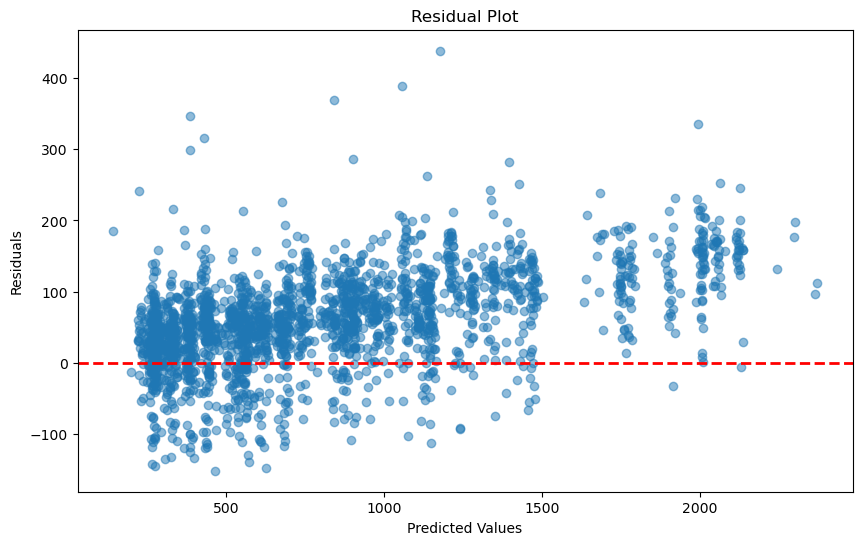

In [10]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 1.2 Increased Complexity

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 69.5519
Average RMSE across all folds: 85.6779
Average R-squared across all folds: 0.9717
-------------------------------------------------------
Test MAE: 71.4222
Test RMSE: 91.1241
Test R-squared: 0.9696


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


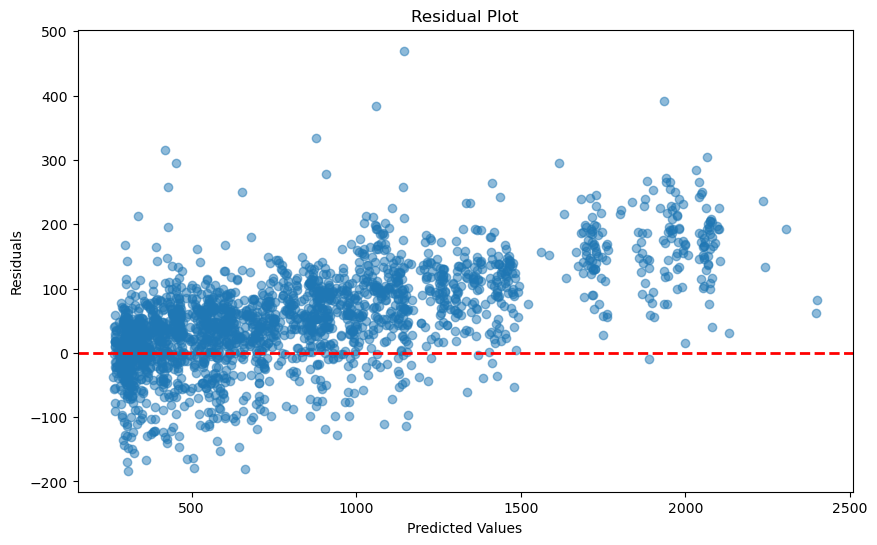

In [13]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)


# 1.3 Different Activation Functions

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 58.7433
Average RMSE across all folds: 79.9731
Average R-squared across all folds: 0.9752
-------------------------------------------------------
Test MAE: 51.9020
Test RMSE: 71.9214
Test R-squared: 0.9810


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


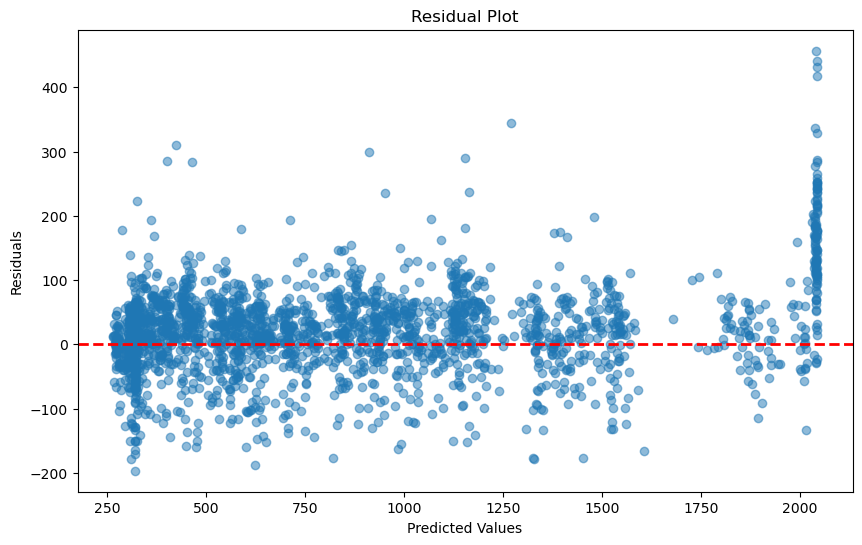

In [14]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)


# 1.4 Adding Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 46.2547
Average RMSE across all folds: 61.0301
Average R-squared across all folds: 0.9857
-------------------------------------------------------
Test MAE: 43.9557
Test RMSE: 59.0605
Test R-squared: 0.9872


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


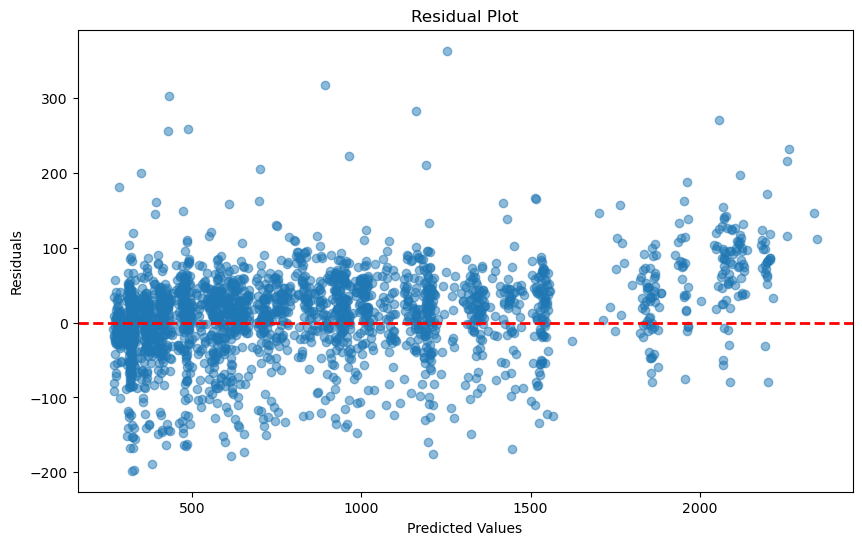

In [15]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 1.41 Added additional Layer, Mix 1.4 and 1.2

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 58.3505
Average RMSE across all folds: 77.3205
Average R-squared across all folds: 0.9771
-------------------------------------------------------
Test MAE: 58.0349
Test RMSE: 74.6213
Test R-squared: 0.9796


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


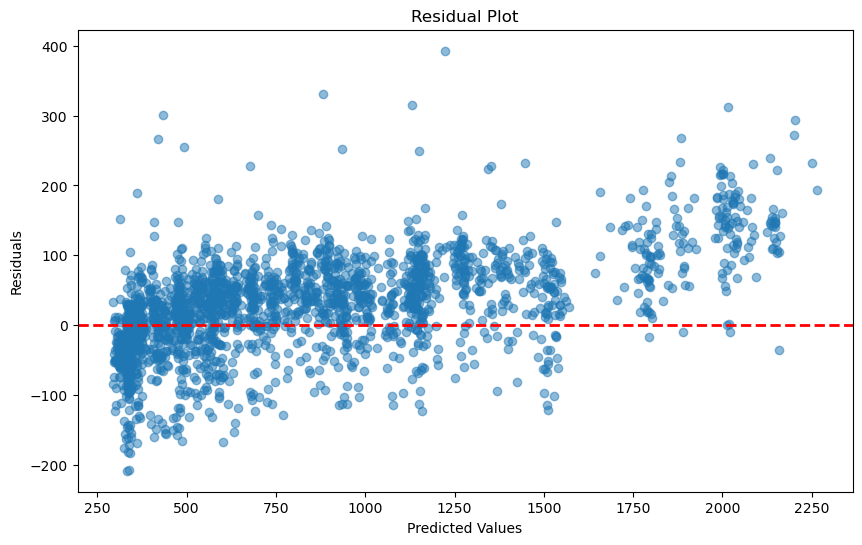

In [16]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)


# 1.5 More Layers and Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Average MAE across all folds: 58.1397
Average RMSE across all folds: 76.5957
Average R-squared across all folds: 0.9775
-------------------------------------------------------
Test MAE: 62.7950
Test RMSE: 83.5285
Test R-squared: 0.9744


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


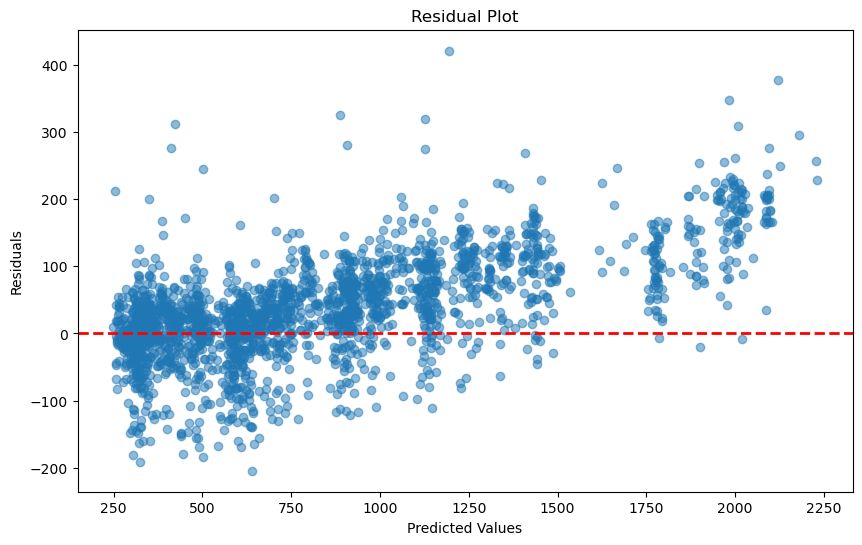

In [17]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)


# 1.6 Mix Model 1.4 and 1.3

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 67.3913
Average RMSE across all folds: 91.7550
Average R-squared across all folds: 0.9677
-------------------------------------------------------
Test MAE: 52.1962
Test RMSE: 72.1461
Test R-squared: 0.9809


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


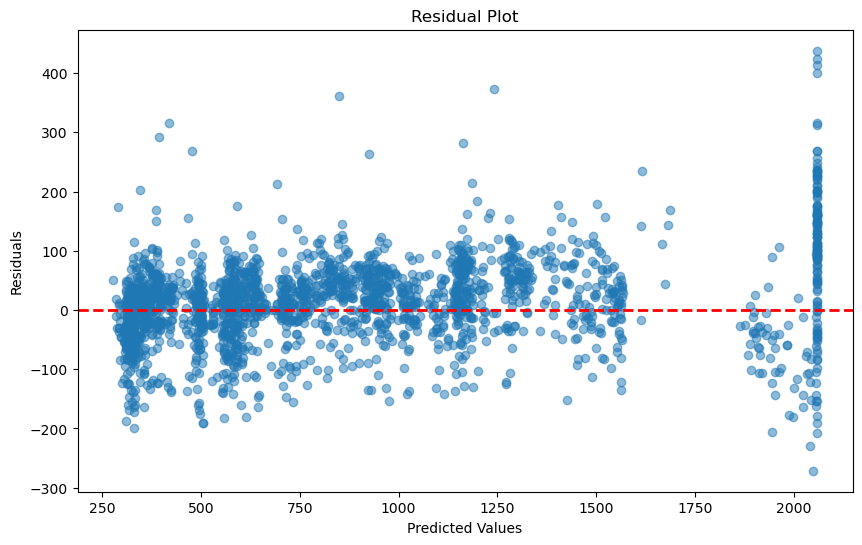

In [18]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 1.7 More Complex, different loss function

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 61.3929
Average RMSE across all folds: 82.6359
Average R-squared across all folds: 0.9737
-------------------------------------------------------
Test MAE: 63.3098
Test RMSE: 89.4875
Test R-squared: 0.9707


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


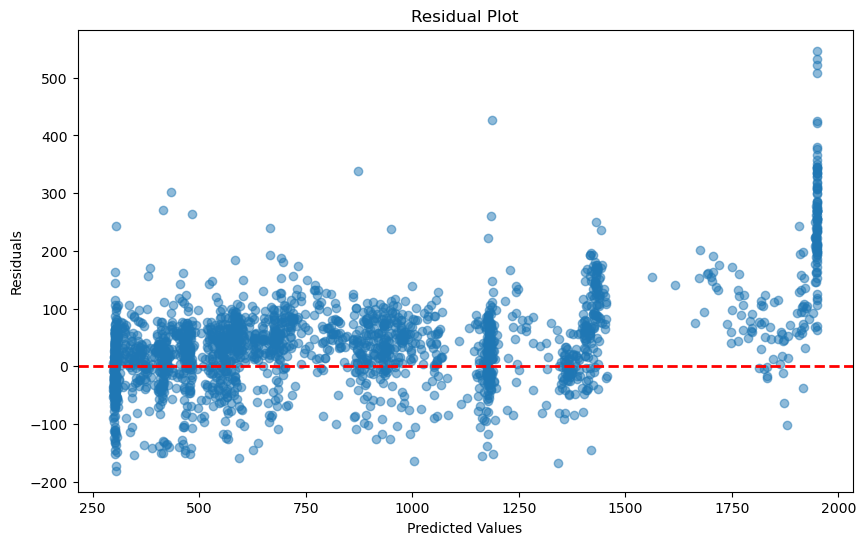

In [19]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)


# 1.8 Old Final Optimized Model

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 42.5220
Average RMSE across all folds: 57.7481
Average R-squared across all folds: 0.9872
-------------------------------------------------------
Test MAE: 41.1783
Test RMSE: 55.4336
Test R-squared: 0.9887


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


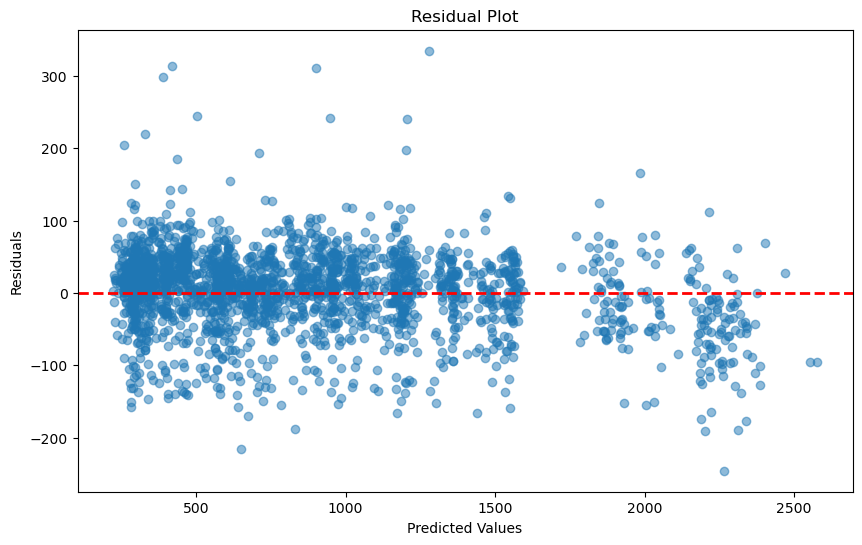

In [20]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 2.0 DF1

# 2.1 Simple Neural Network

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Average MAE across all folds: 48.7602
Average RMSE across all folds: 60.6950
Average R-squared across all folds: 0.8937
-------------------------------------------------------
Test MAE: 45.3128
Test RMSE: 57.5198
Test R-squared: 0.8995


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


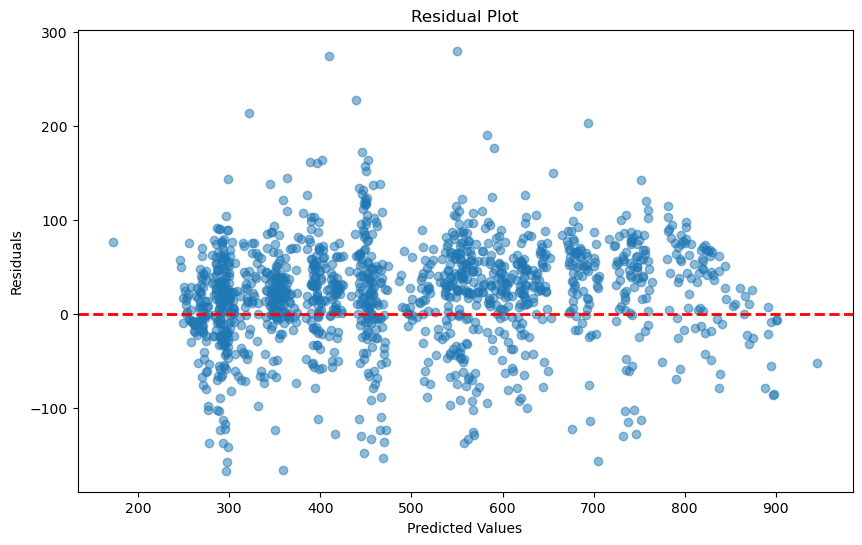

In [30]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 2.2 Increased Complexity

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 48.9034
Average RMSE across all folds: 61.1630
Average R-squared across all folds: 0.8920
-------------------------------------------------------
Test MAE: 54.0533
Test RMSE: 65.8392
Test R-squared: 0.8683


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


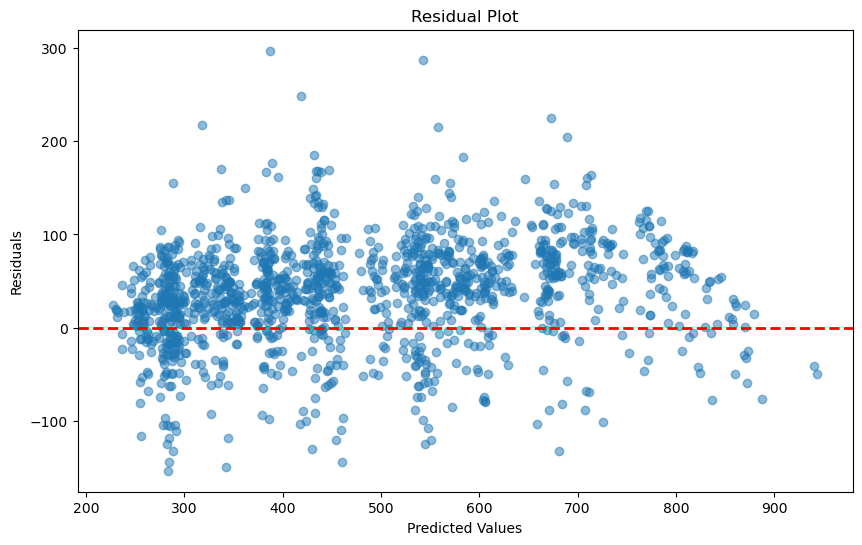

In [31]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 2.3 Different Activation Functions

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Average MAE across all folds: 46.9818
Average RMSE across all folds: 60.0747
Average R-squared across all folds: 0.8958
-------------------------------------------------------
Test MAE: 47.7919
Test RMSE: 59.7944
Test R-squared: 0.8913


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


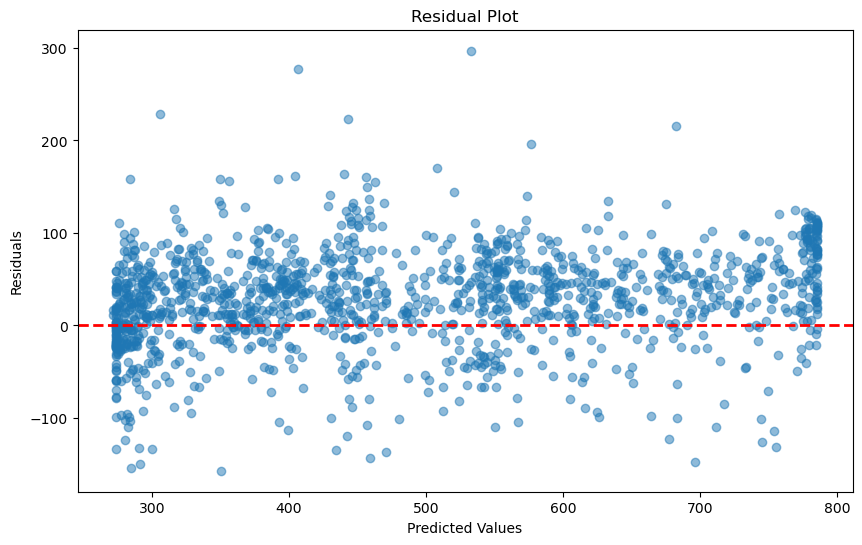

In [32]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 2.4 Adding Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Average MAE across all folds: 40.4828
Average RMSE across all folds: 53.8158
Average R-squared across all folds: 0.9165
-------------------------------------------------------
Test MAE: 40.4878
Test RMSE: 52.9136
Test R-squared: 0.9149


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


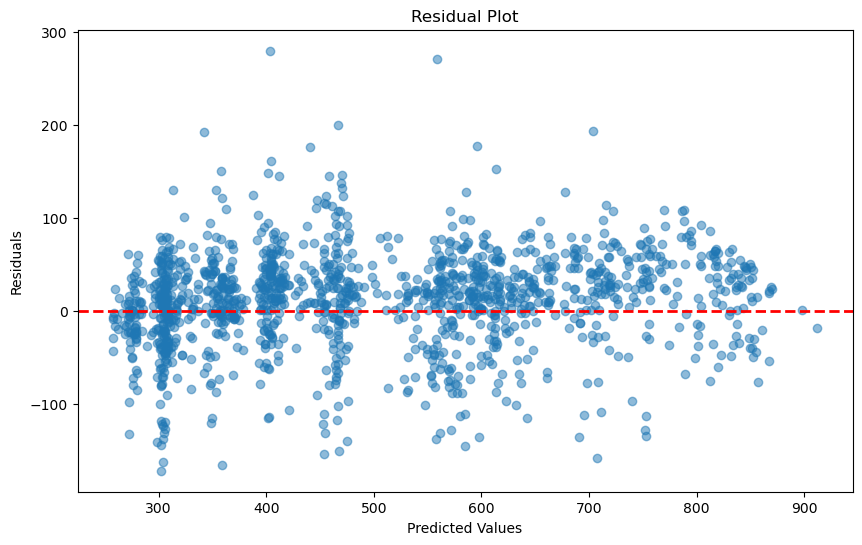

In [33]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 2.5 More Layers and Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 43.6665
Average RMSE across all folds: 56.7044
Average R-squared across all folds: 0.9073
-------------------------------------------------------
Test MAE: 43.4757
Test RMSE: 55.7276
Test R-squared: 0.9056


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


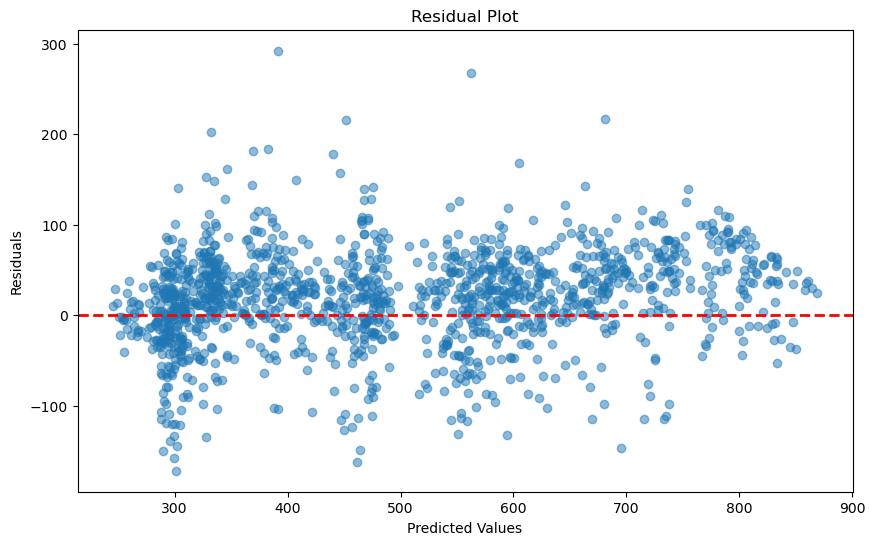

In [34]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 2.6 Mix Model 2.4 and 2.3

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Average MAE across all folds: 47.0315
Average RMSE across all folds: 60.9926
Average R-squared across all folds: 0.8925
-------------------------------------------------------
Test MAE: 45.3605
Test RMSE: 57.9220
Test R-squared: 0.8980


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


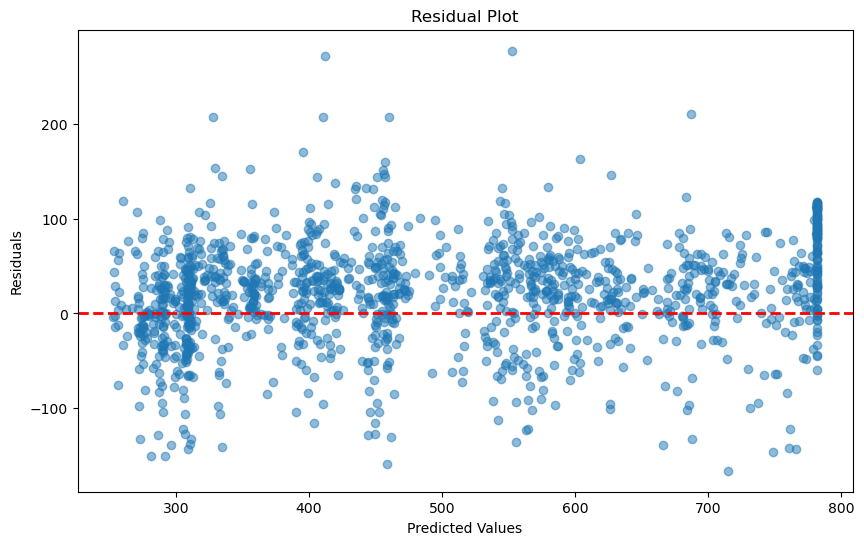

In [35]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 2.7 More Complex, different Loss Function

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 44.0532
Average RMSE across all folds: 56.8845
Average R-squared across all folds: 0.9067
-------------------------------------------------------
Test MAE: 41.9355
Test RMSE: 54.4604
Test R-squared: 0.9099


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


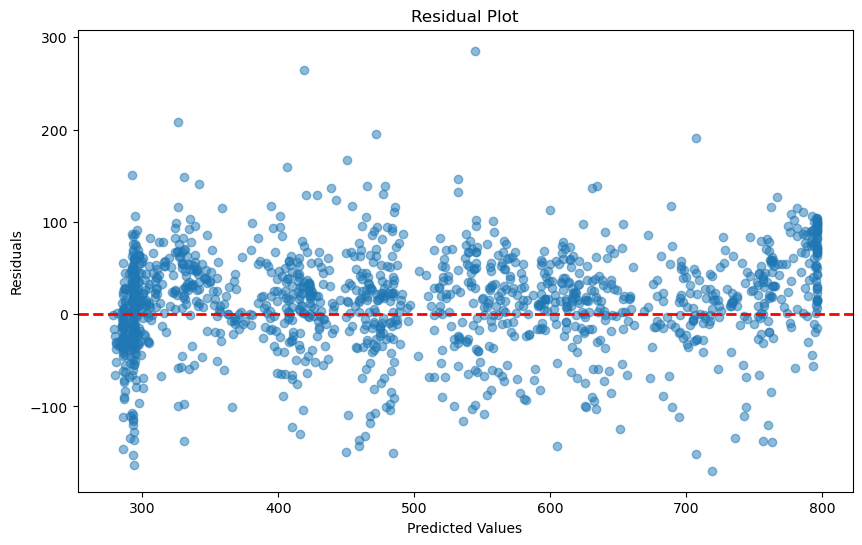

In [36]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 2.71 Change in Activation Function

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Average MAE across all folds: 44.7328
Average RMSE across all folds: 57.7074
Average R-squared across all folds: 0.9040
-------------------------------------------------------
Test MAE: 43.4880
Test RMSE: 55.4007
Test R-squared: 0.9067


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


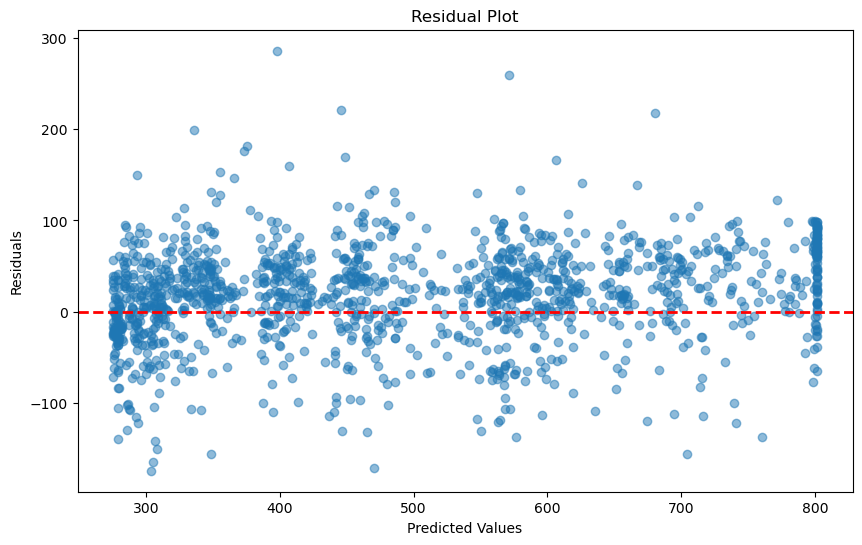

In [37]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 2.8 Old Final Optimized Model

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 38.9461
Average RMSE across all folds: 53.4756
Average R-squared across all folds: 0.9176
-------------------------------------------------------
Test MAE: 35.0466
Test RMSE: 47.9548
Test R-squared: 0.9301


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


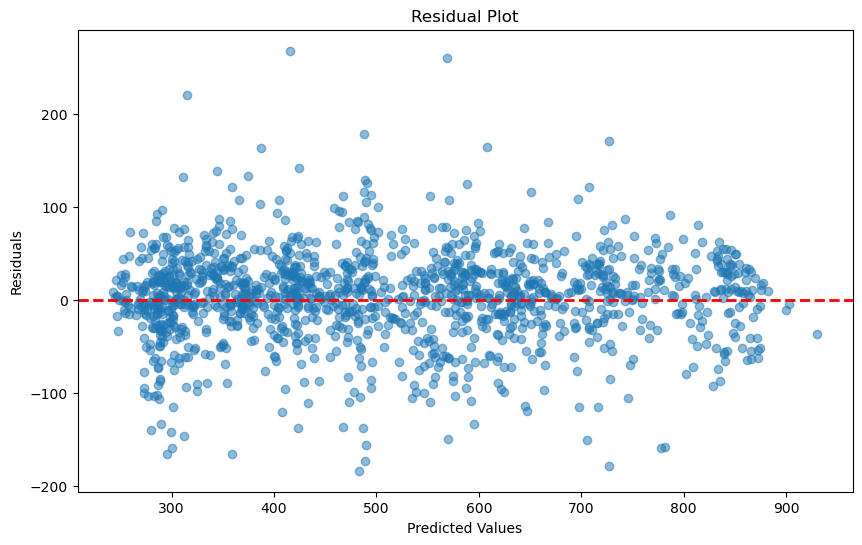

In [38]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 3.0 DF2

# 3.1 Simple Neural Network

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Average MAE across all folds: 75.4185
Average RMSE across all folds: 91.3684
Average R-squared across all folds: 0.9494
-------------------------------------------------------
Test MAE: 70.2376
Test RMSE: 86.3428
Test R-squared: 0.9553


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


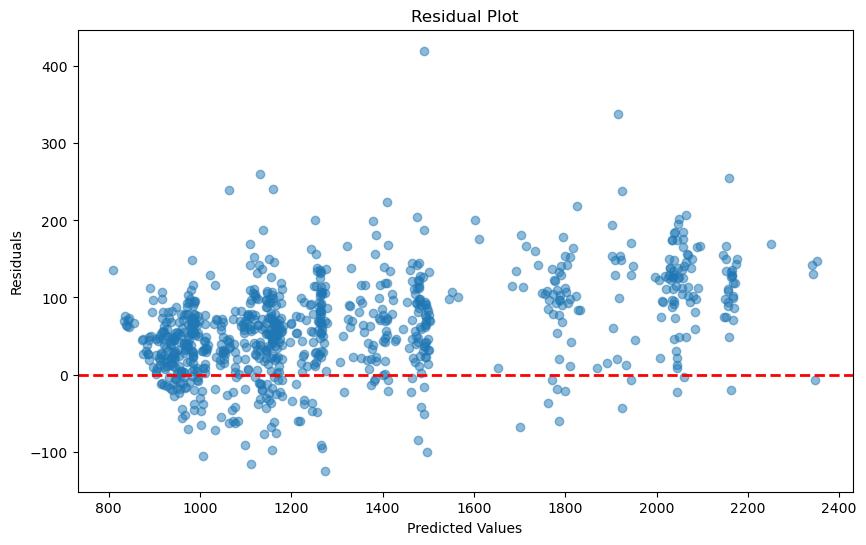

In [43]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 3.2 Increased Complexity

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 86.4457
Average RMSE across all folds: 102.6737
Average R-squared across all folds: 0.9340
-------------------------------------------------------
Test MAE: 69.9210
Test RMSE: 88.5000
Test R-squared: 0.9530


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


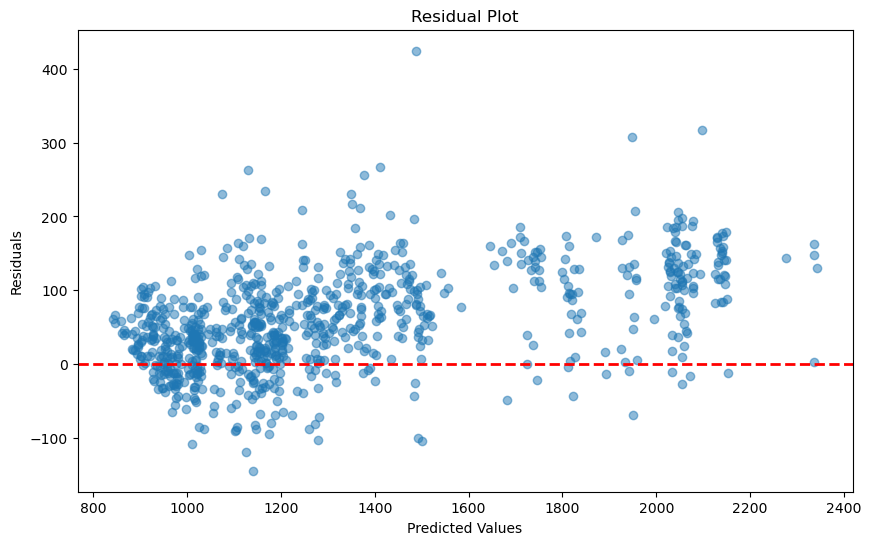

In [44]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 3.3 Different Activation Functions

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Average MAE across all folds: 68.4676
Average RMSE across all folds: 90.8122
Average R-squared across all folds: 0.9496
-------------------------------------------------------
Test MAE: 63.8190
Test RMSE: 84.4522
Test R-squared: 0.9572


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


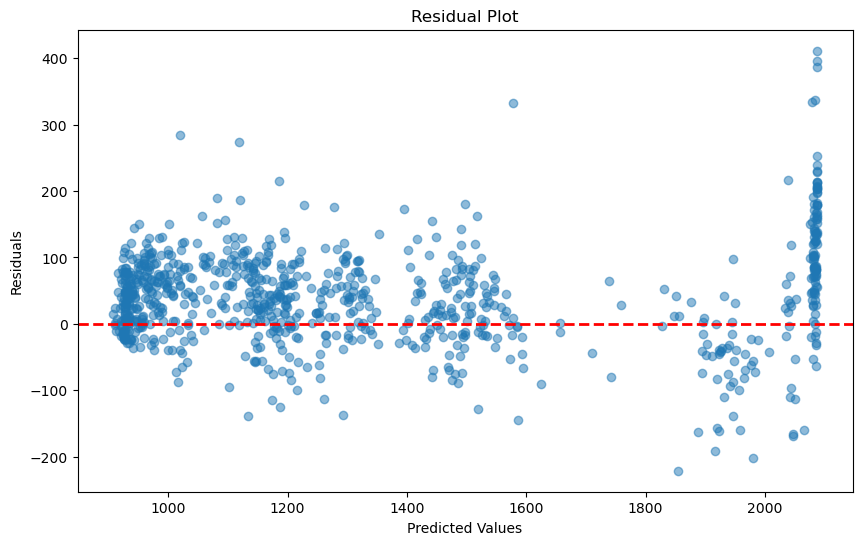

In [45]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 3.4 Adding Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Average MAE across all folds: 47.1369
Average RMSE across all folds: 61.7319
Average R-squared across all folds: 0.9769
-------------------------------------------------------
Test MAE: 44.3529
Test RMSE: 58.4227
Test R-squared: 0.9795


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


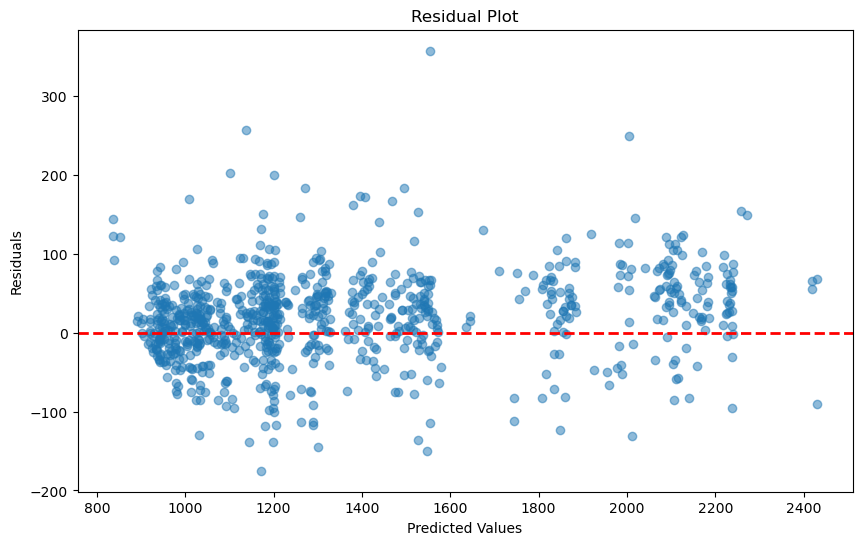

In [46]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 3.5 More Layers and Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Average MAE across all folds: 63.9470
Average RMSE across all folds: 83.0404
Average R-squared across all folds: 0.9583
-------------------------------------------------------
Test MAE: 62.3180
Test RMSE: 80.7447
Test R-squared: 0.9609


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


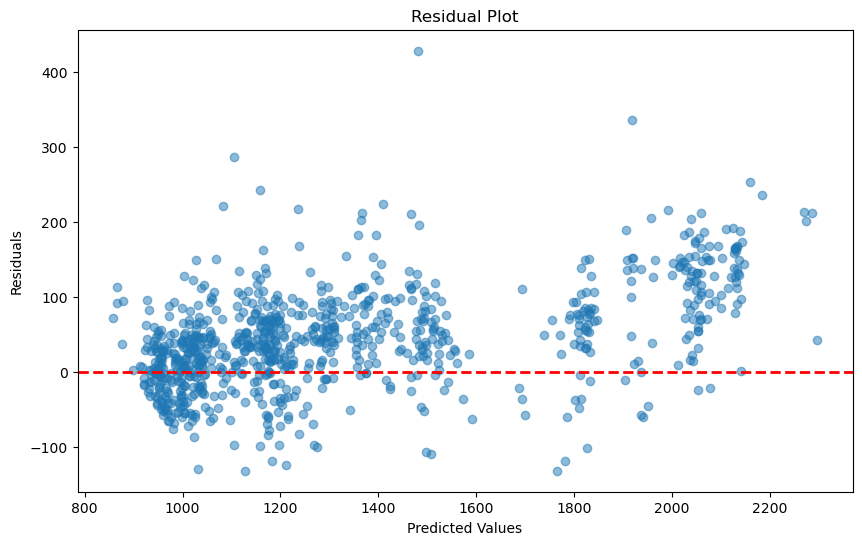

In [47]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 3.6 Mix Model 1.4 and 1.3

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Average MAE across all folds: 100.0875
Average RMSE across all folds: 133.2419
Average R-squared across all folds: 0.8906
-------------------------------------------------------
Test MAE: 92.4266
Test RMSE: 116.8522
Test R-squared: 0.9181


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


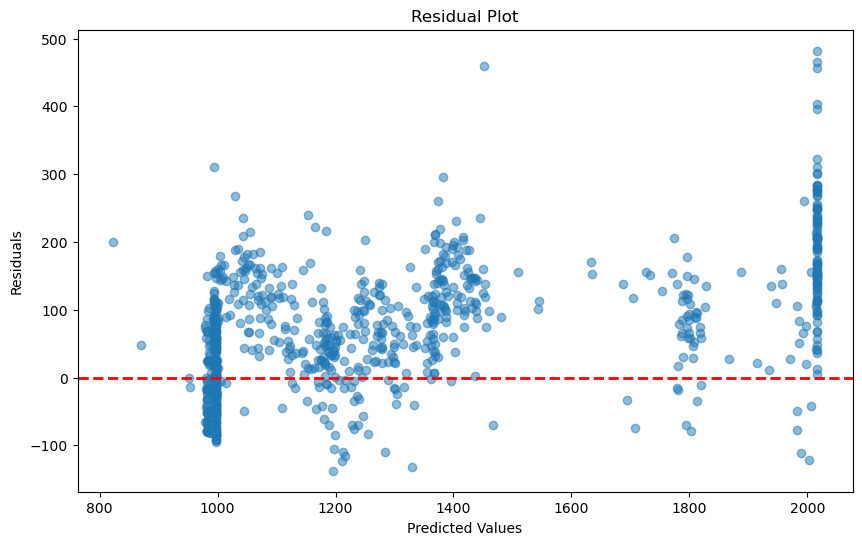

In [48]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 3.7 More Complex, Different Loss Function

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Average MAE across all folds: 68.9568
Average RMSE across all folds: 89.9766
Average R-squared across all folds: 0.9507
-------------------------------------------------------
Test MAE: 63.0812
Test RMSE: 81.1796
Test R-squared: 0.9605


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


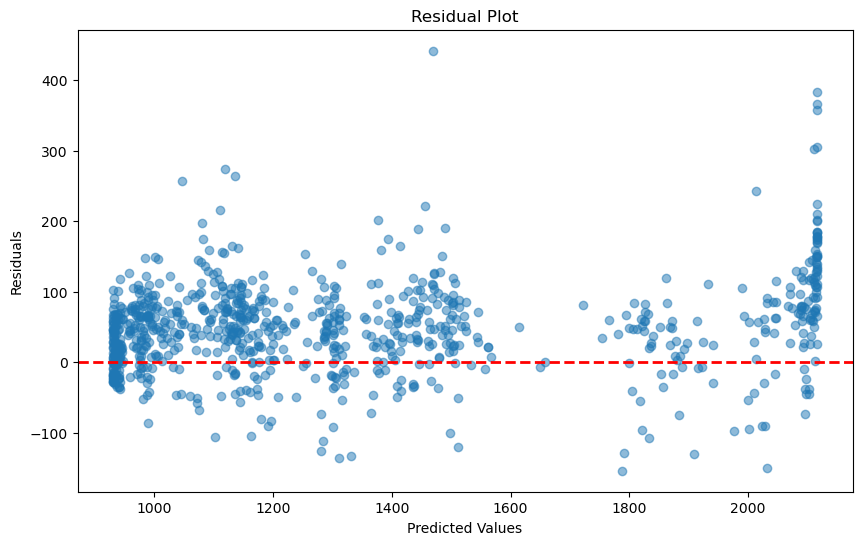

In [49]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 3.8 Old Final Optimizted Model

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Average MAE across all folds: 39.9375
Average RMSE across all folds: 55.4291
Average R-squared across all folds: 0.9814
-------------------------------------------------------
Test MAE: 38.9033
Test RMSE: 53.6885
Test R-squared: 0.9827


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


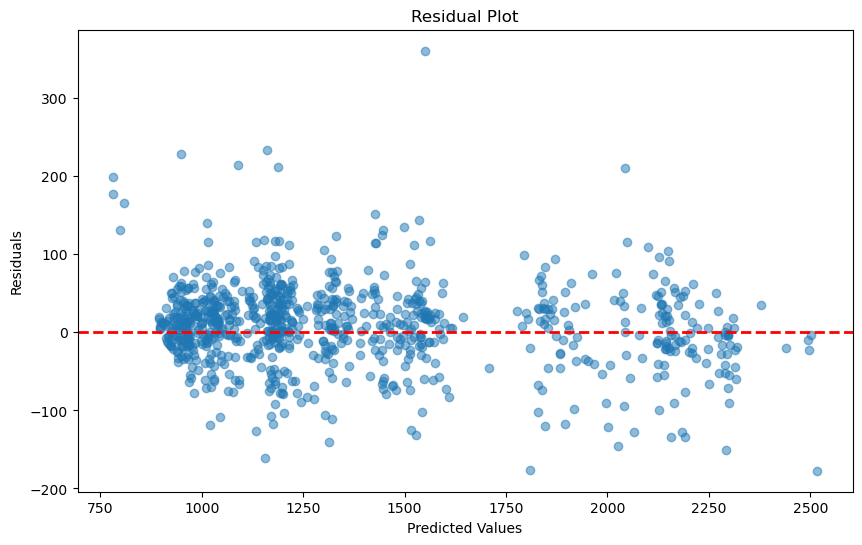

In [50]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 4.0 DF3

# 4.1 Simple Neural Network

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 73.6385
Average RMSE across all folds: 87.7789
Average R-squared across all folds: 0.8994
-------------------------------------------------------
Test MAE: 87.2999
Test RMSE: 103.7551
Test R-squared: 0.8682


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


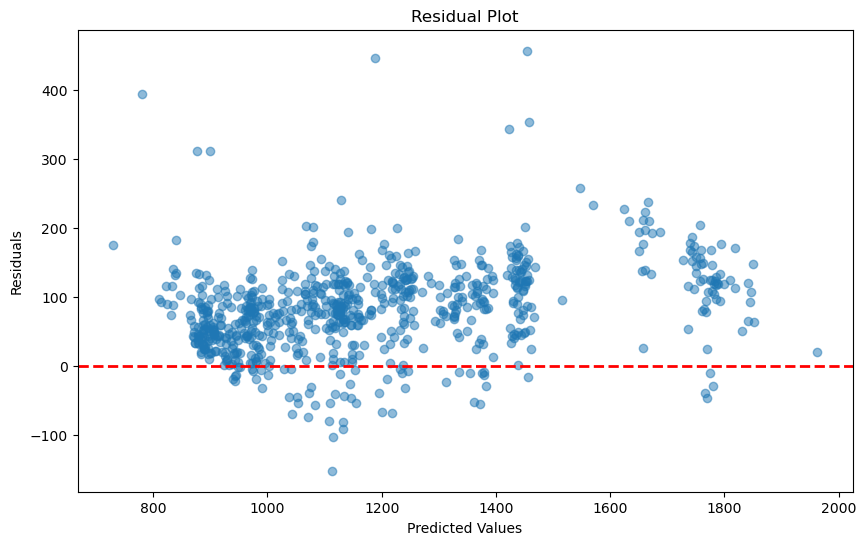

In [53]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 4.2 Increased Complexity

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Average MAE across all folds: 83.3518
Average RMSE across all folds: 98.0078
Average R-squared across all folds: 0.8736
-------------------------------------------------------
Test MAE: 90.7739
Test RMSE: 107.4755
Test R-squared: 0.8586


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


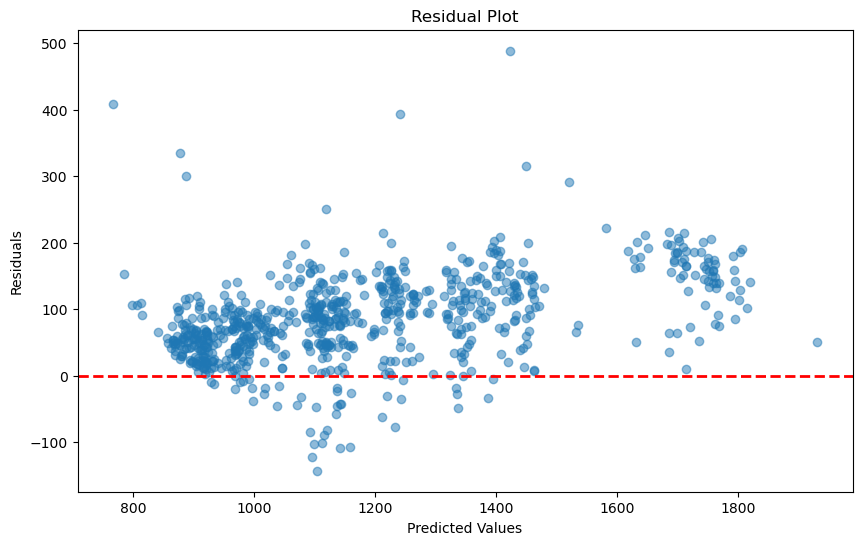

In [54]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 4.4 Adding Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Average MAE across all folds: 43.1736
Average RMSE across all folds: 56.5872
Average R-squared across all folds: 0.9588
-------------------------------------------------------
Test MAE: 44.6092
Test RMSE: 59.9633
Test R-squared: 0.9560


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


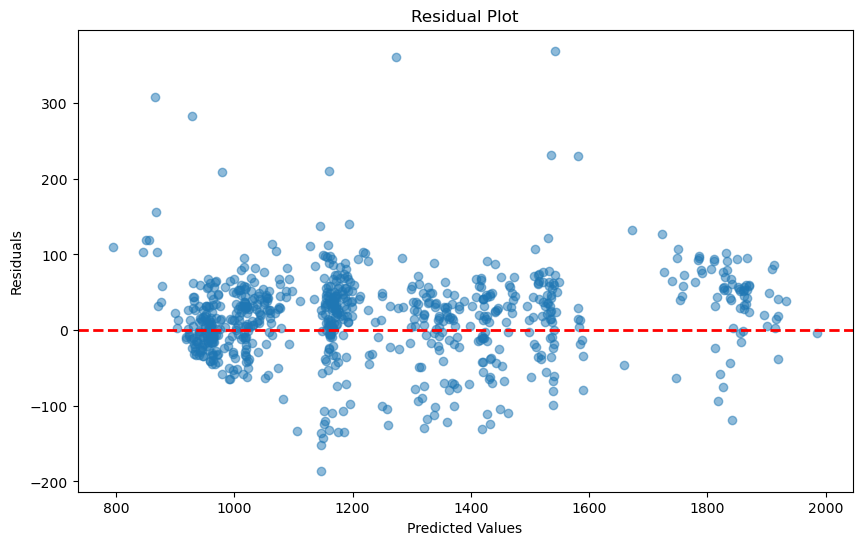

In [55]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 4.5 More Layers and Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Average MAE across all folds: 57.1303
Average RMSE across all folds: 72.4410
Average R-squared across all folds: 0.9325
-------------------------------------------------------
Test MAE: 57.2405
Test RMSE: 73.3649
Test R-squared: 0.9341


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


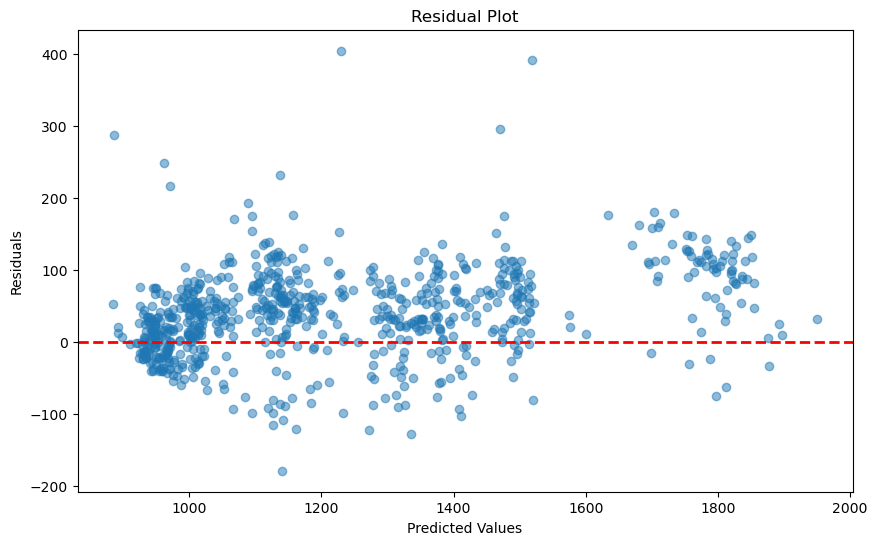

In [56]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 4.8 Old Final Optimized Model

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Average MAE across all folds: 39.0332
Average RMSE across all folds: 53.2408
Average R-squared across all folds: 0.9636
-------------------------------------------------------
Test MAE: 37.9183
Test RMSE: 52.9454
Test R-squared: 0.9657


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


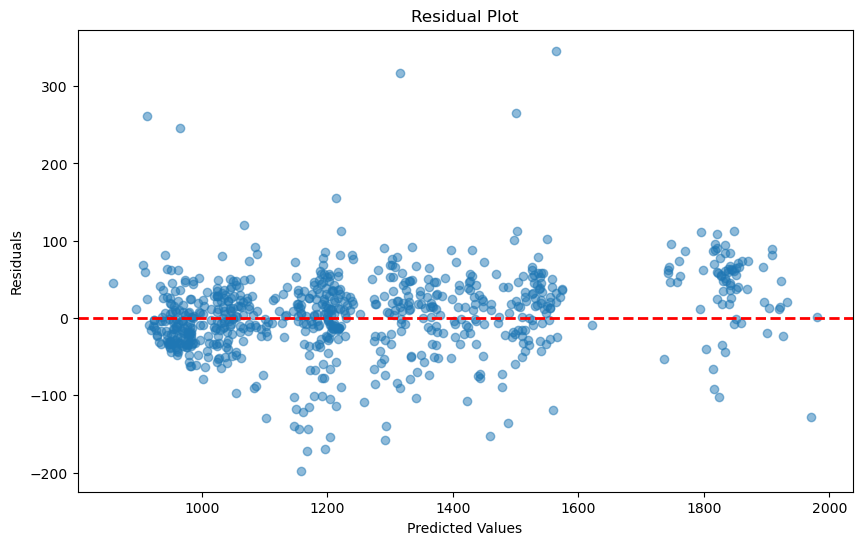

In [57]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 5.0 DF4

# 5.1 Simple Neural Network

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 75.0598
Average RMSE across all folds: 89.0901
Average R-squared across all folds: 0.8975
-------------------------------------------------------
Test MAE: 68.7451
Test RMSE: 84.0216
Test R-squared: 0.9136


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


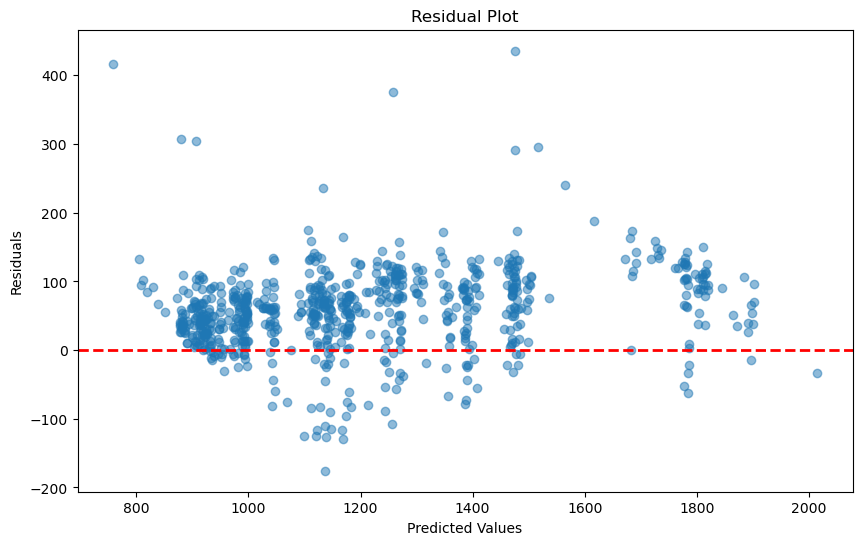

In [64]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 5.2 Increased Complexity

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Average MAE across all folds: 77.8228
Average RMSE across all folds: 91.5563
Average R-squared across all folds: 0.8913
-------------------------------------------------------
Test MAE: 72.5442
Test RMSE: 86.7986
Test R-squared: 0.9078


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


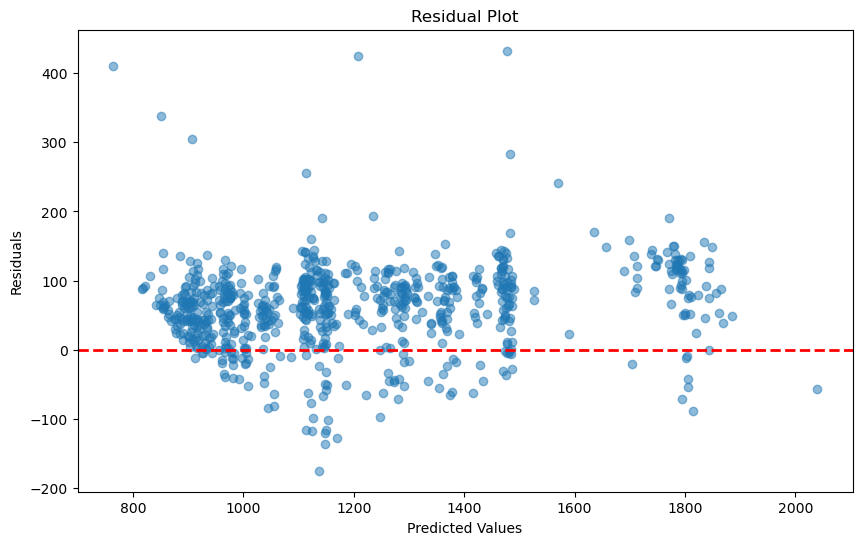

In [65]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 5.3 Different Activation Function

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Average MAE across all folds: 63.1587
Average RMSE across all folds: 83.7510
Average R-squared across all folds: 0.9091
-------------------------------------------------------
Test MAE: 89.7973
Test RMSE: 110.7502
Test R-squared: 0.8499


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


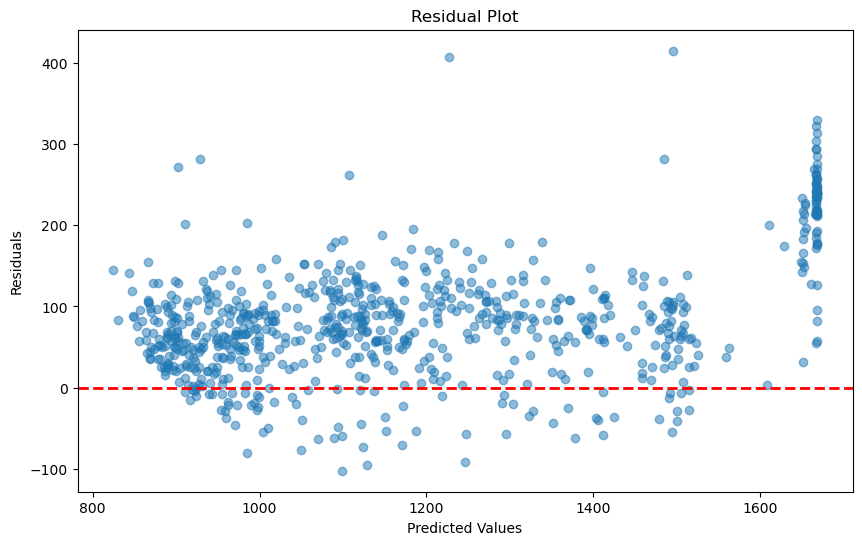

In [66]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 5.4 Adding Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Average MAE across all folds: 42.9464
Average RMSE across all folds: 56.8575
Average R-squared across all folds: 0.9584
-------------------------------------------------------
Test MAE: 43.2785
Test RMSE: 57.7099
Test R-squared: 0.9592


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


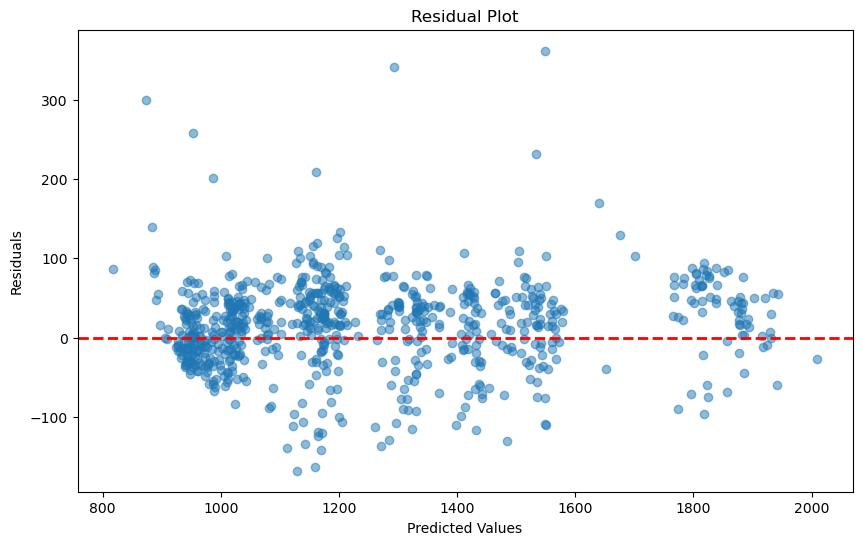

In [67]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 5.5 More Layers and Batch Normalization

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Average MAE across all folds: 58.1297
Average RMSE across all folds: 73.8105
Average R-squared across all folds: 0.9298
-------------------------------------------------------
Test MAE: 59.9874
Test RMSE: 76.0542
Test R-squared: 0.9292


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


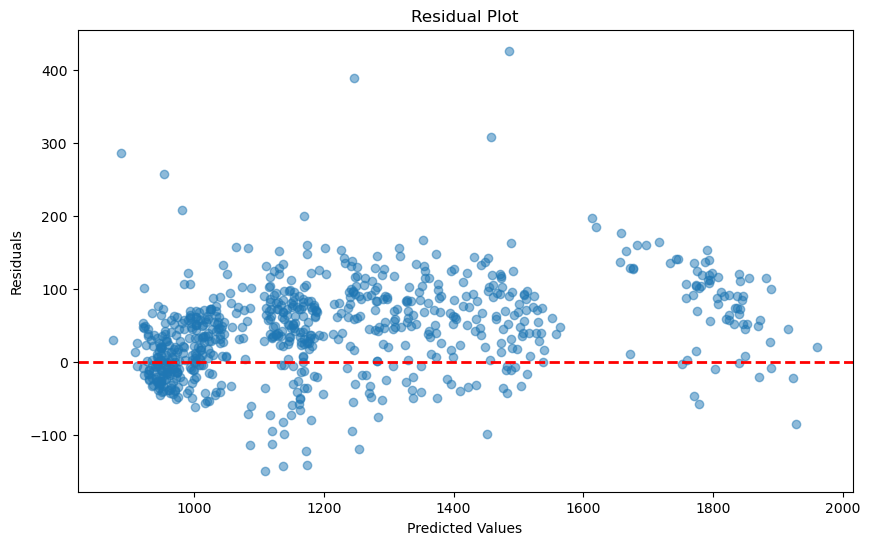

In [68]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 5.6 Mix Model 5.4 and 5.3

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Average MAE across all folds: 122.0967
Average RMSE across all folds: 172.0370
Average R-squared across all folds: 0.5620
-------------------------------------------------------
Test MAE: 73.9852
Test RMSE: 98.1872
Test R-squared: 0.8820


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


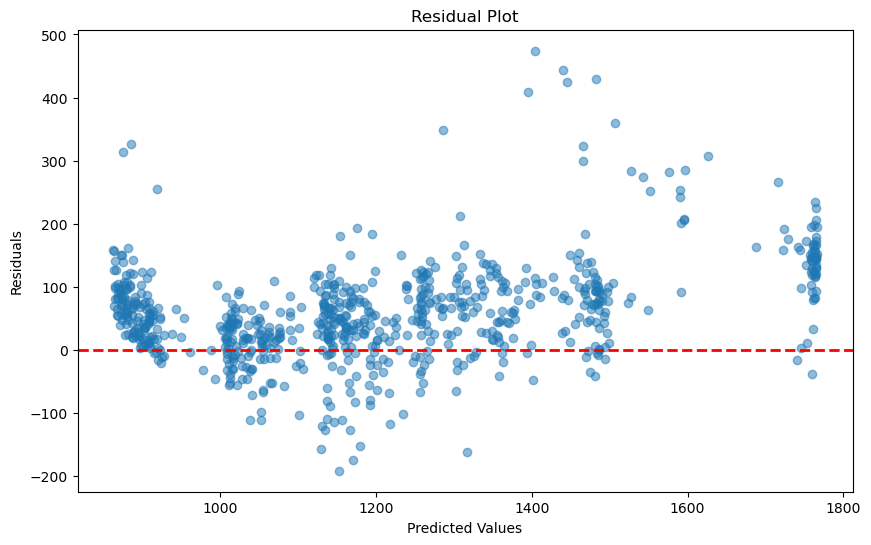

In [69]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# 5.7 More Complex, Different Loss Function

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Average MAE across all folds: 66.0009
Average RMSE across all folds: 83.7365
Average R-squared across all folds: 0.9098
-------------------------------------------------------
Test MAE: 55.9575
Test RMSE: 73.4093
Test R-squared: 0.9340


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


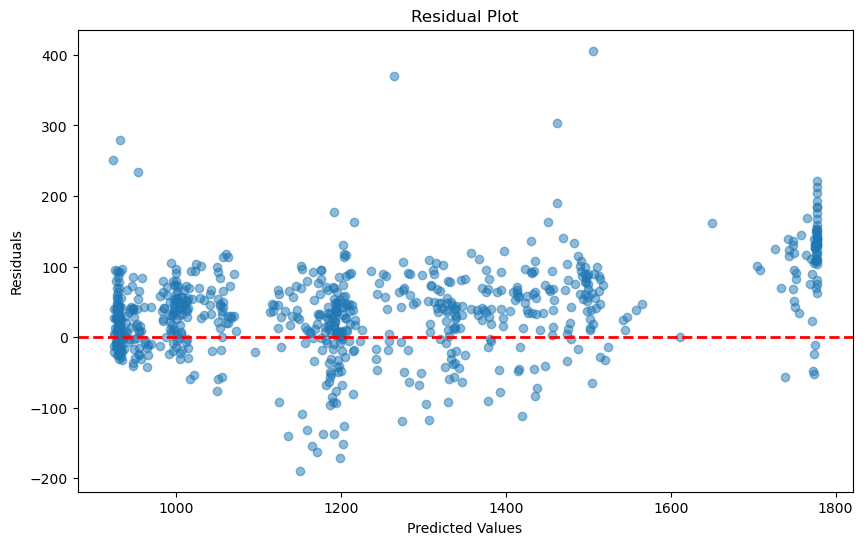

In [70]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="tanh"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# 5.8 Old Final Optimized Model

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Average MAE across all folds: 38.1144
Average RMSE across all folds: 52.8427
Average R-squared across all folds: 0.9641
-------------------------------------------------------
Test MAE: 35.7219
Test RMSE: 51.8466
Test R-squared: 0.9671


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


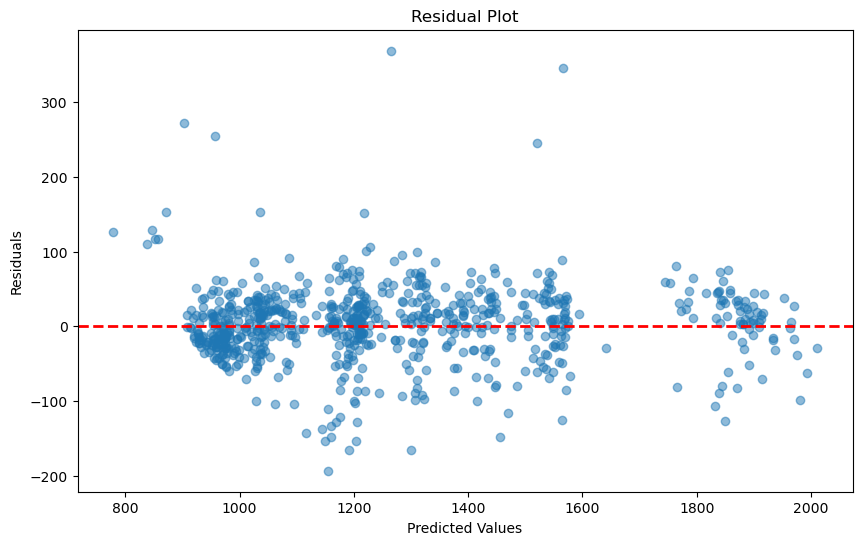

In [71]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# Optimizing .4 Model

In [72]:
import numpy as np
import pandas as pd
import sklearn
import scikeras
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from scikeras.wrappers import KerasRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.stats.api as sms
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

def create_model(input_dim, neurons_1=128, neurons_2=64, dropout_rate=0.5, activation="relu", optimizer="adam"):
    print(f"Creating model with: input_dim={input_dim}, neurons_1={neurons_1}, neurons_2={neurons_2}, dropout_rate={dropout_rate}, activation={activation}, optimizer={optimizer}")
    model = Sequential()
    model.add(Dense(neurons_1, input_shape=(input_dim,), activation=activation))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(neurons_2, activation=activation))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer=optimizer, metrics=["mean_absolute_error"])
    return model

param_grid = {
    "model__neurons_1": [64, 128, 256],
    "model__neurons_2": [32, 64, 128],
    "model__dropout_rate": [0.2, 0.3, 0.5],
    "model__activation": ["relu", "selu", "softplus"],
    "model__optimizer": ["adam", "rmsprop", "adamax", "nadam"],
}

input_dim = X_train.shape[1]  # Assuming X_train is defined

# Initialize the KerasRegressor
model = KerasRegressor(model=create_model, input_dim=input_dim, verbose=0)

# Perform the grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, scoring="neg_mean_absolute_error")
grid_result = grid.fit(X_train, y_train)

# Summarize results
print(f"Best: {grid_result.best_score_} using {grid_result.best_params_}")
means = grid_result.cv_results_["mean_test_score"]
stds = grid_result.cv_results_["std_test_score"]
params = grid_result.cv_results_["params"]
for mean, std, param in zip(means, stds, params):
    print(f"{mean:.4f} ({std:.4f}) with: {param}")



KeyboardInterrupt: 

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 18.9941
Average RMSE across all folds: 35.4431
Average R-squared across all folds: 0.9962
-------------------------------------------------------
Test MAE: 14.7596
Test RMSE: 26.3300
Test R-squared: 0.9982


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


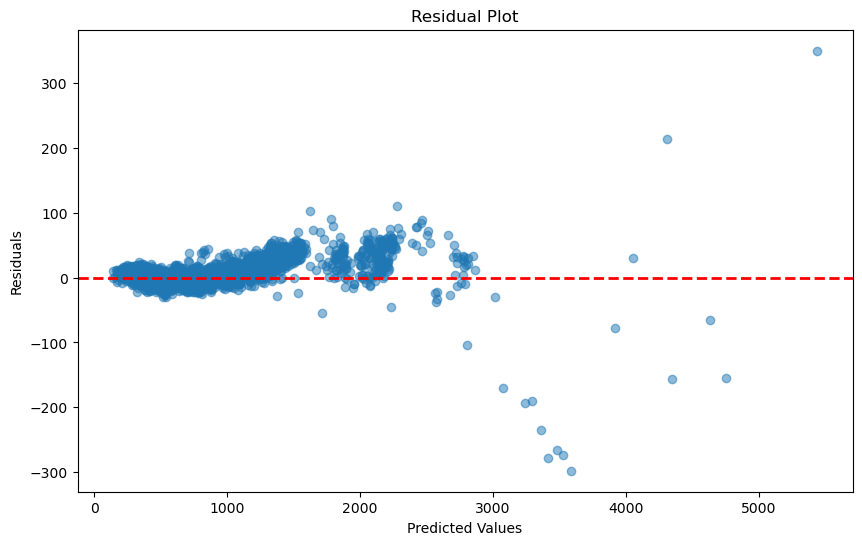

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 18.3324
Average RMSE across all folds: 25.3275
Average R-squared across all folds: 0.9981
-------------------------------------------------------
Test MAE: 19.4899
Test RMSE: 38.2428
Test R-squared: 0.9962


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


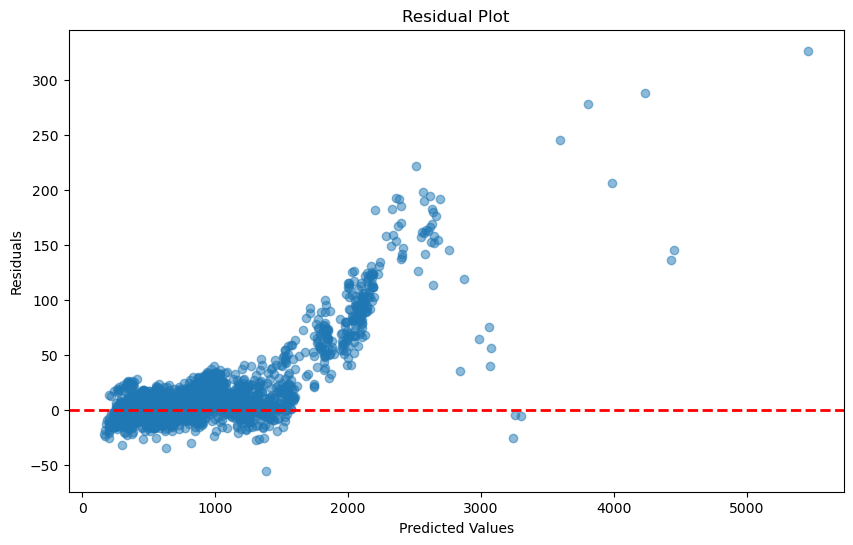

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 25.1912
Average RMSE across all folds: 43.0433
Average R-squared across all folds: 0.9946
-------------------------------------------------------
Test MAE: 23.0135
Test RMSE: 43.9708
Test R-squared: 0.9950


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


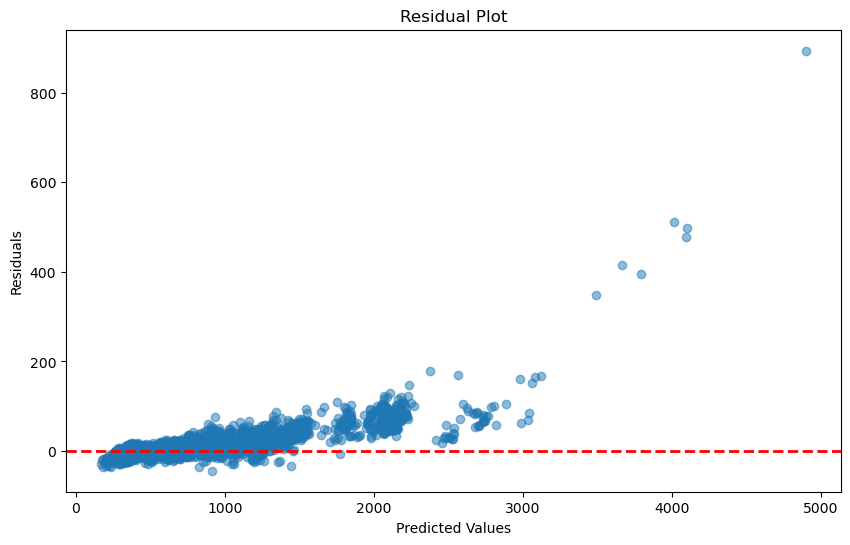

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(64, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 18.5875
Average RMSE across all folds: 32.9121
Average R-squared across all folds: 0.9968
-------------------------------------------------------
Test MAE: 19.2326
Test RMSE: 29.0094
Test R-squared: 0.9978


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


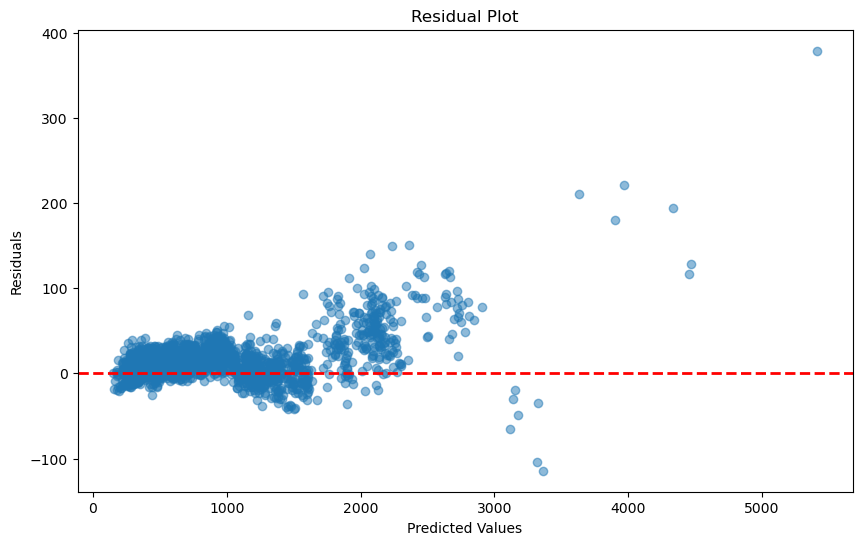

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# Full Dataset Optimized Models

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 43.8656
Average RMSE across all folds: 59.4116
Average R-squared across all folds: 0.9865
-------------------------------------------------------
Test MAE: 43.5187
Test RMSE: 59.8308
Test R-squared: 0.9863


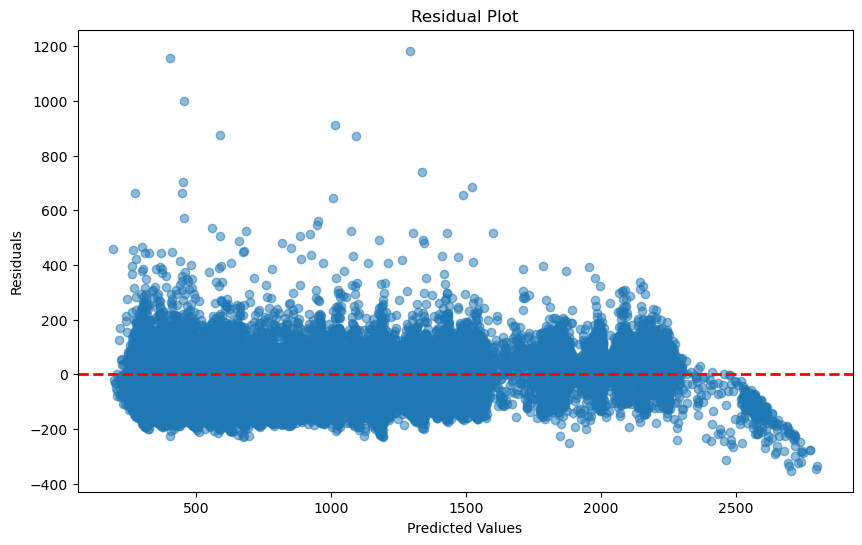

In [75]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 898us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 961us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 926us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 921us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 4s 968us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 43.1010
Average RMSE across all folds: 58.8657
Average R-squared across all folds: 0.9867
-------------------------------------------------------
Test MAE: 47.1391
Test RMSE: 62.9499
Test R-squared: 0.9848


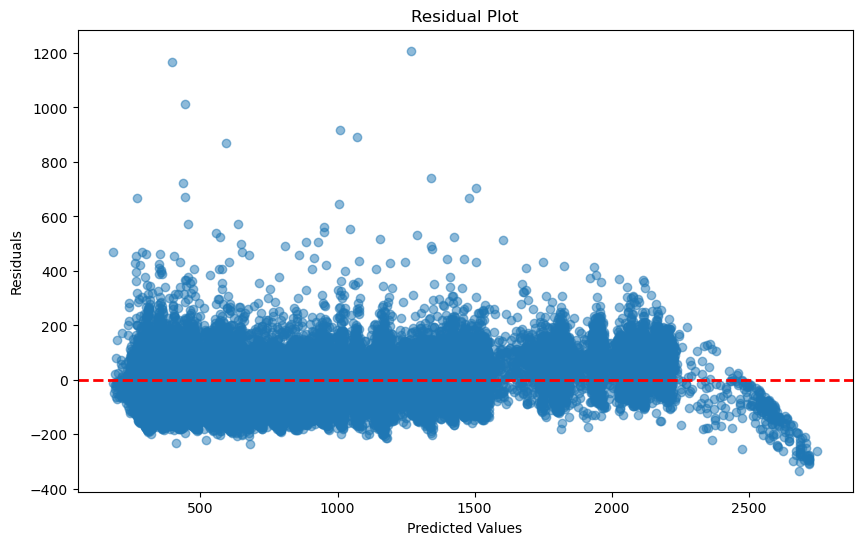

In [76]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 827us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 834us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 841us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 836us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 820us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 3s 833us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 47.9507
Average RMSE across all folds: 63.3306
Average R-squared across all folds: 0.9846
-------------------------------------------------------
Test MAE: 49.1970
Test RMSE: 64.6759
Test R-squared: 0.9840


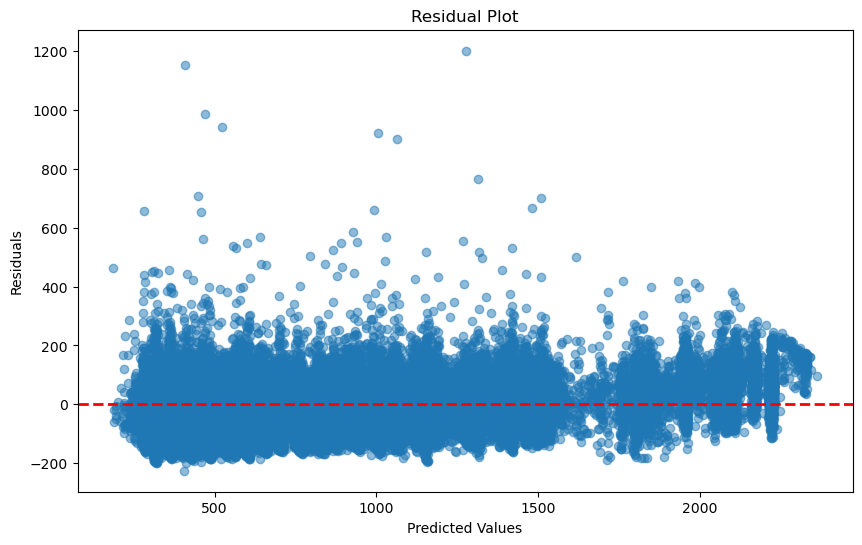

In [77]:
def create_model(input_dim):        # Standard .4 Model but with nadam
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 856us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 830us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 819us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 833us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 822us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 3s 831us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 49.4214
Average RMSE across all folds: 64.6790
Average R-squared across all folds: 0.9840
-------------------------------------------------------
Test MAE: 48.5059
Test RMSE: 64.3055
Test R-squared: 0.9842


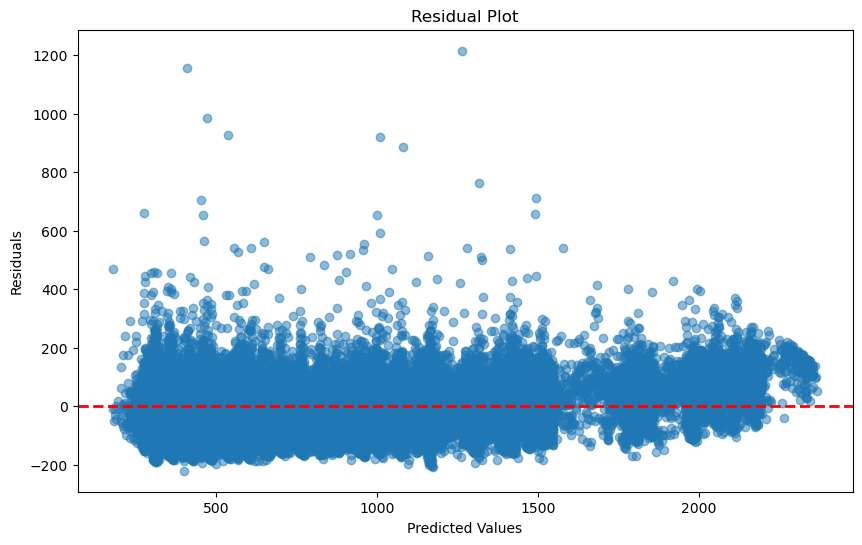

In [78]:
def create_model(input_dim):           #First .4 Model
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 832us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 29s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 891us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 43.8130
Average RMSE across all folds: 59.6274
Average R-squared across all folds: 0.9864
-------------------------------------------------------
Test MAE: 42.9495
Test RMSE: 58.7704
Test R-squared: 0.9868


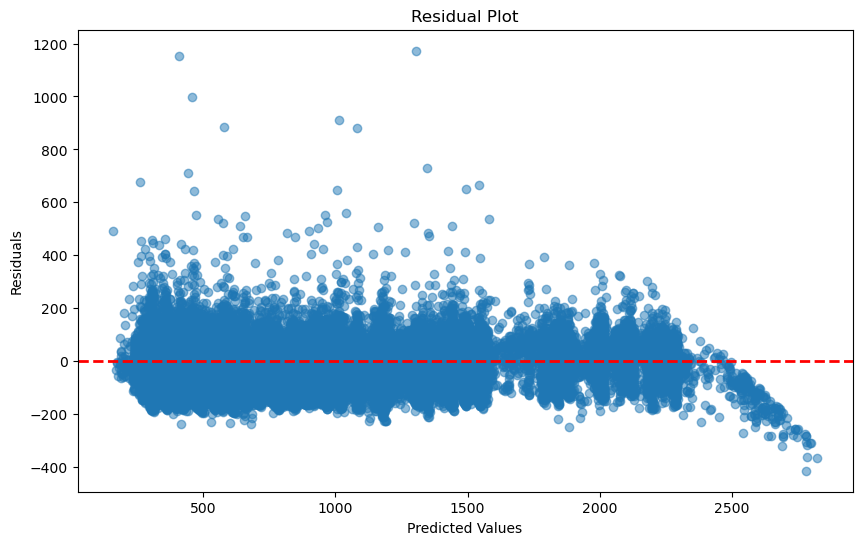

In [79]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 42.6912
Average RMSE across all folds: 58.4249
Average R-squared across all folds: 0.9869
-------------------------------------------------------
Test MAE: 43.3835
Test RMSE: 59.0097
Test R-squared: 0.9867


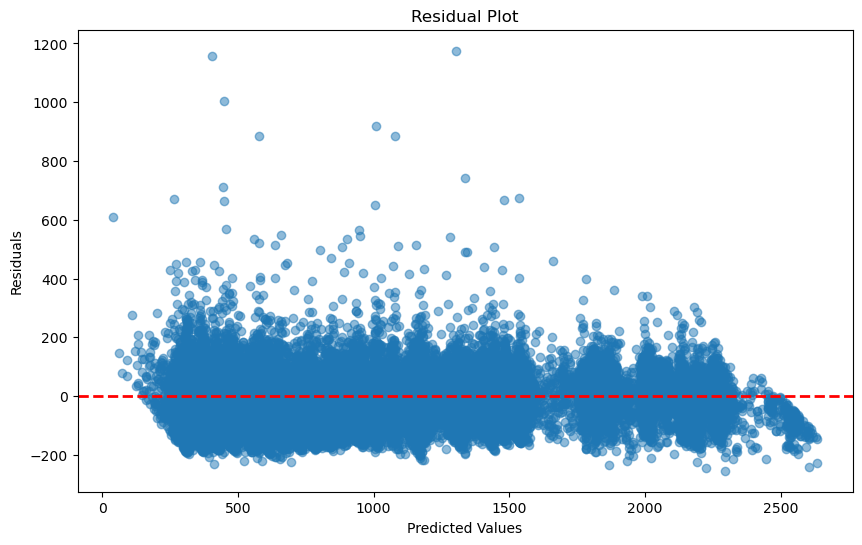

In [80]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 45.0736
Average RMSE across all folds: 60.0766
Average R-squared across all folds: 0.9862
-------------------------------------------------------
Test MAE: 44.5050
Test RMSE: 59.4618
Test R-squared: 0.9865


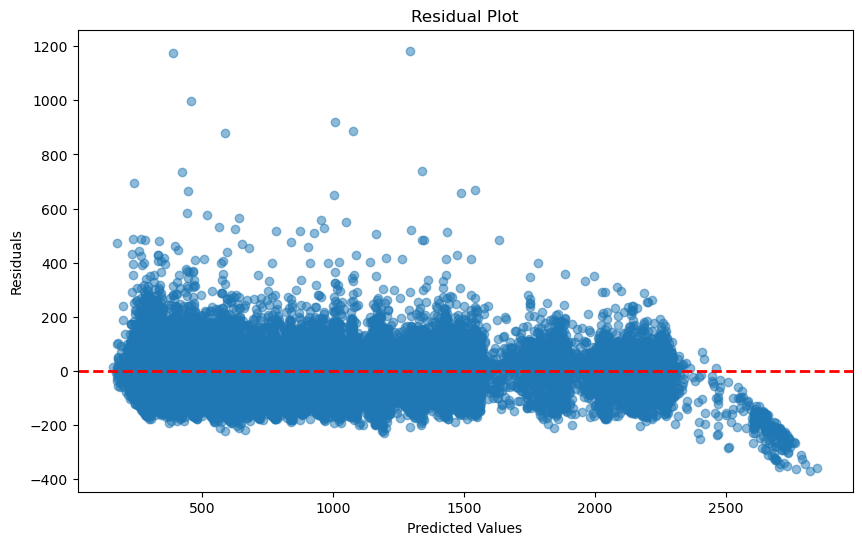

In [4]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dense(128, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 773us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 828us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 773us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 827us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 800us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 3s 785us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 40.7622
Average RMSE across all folds: 57.6797
Average R-squared across all folds: 0.9873
-------------------------------------------------------
Test MAE: 40.0925
Test RMSE: 57.2517
Test R-squared: 0.9874


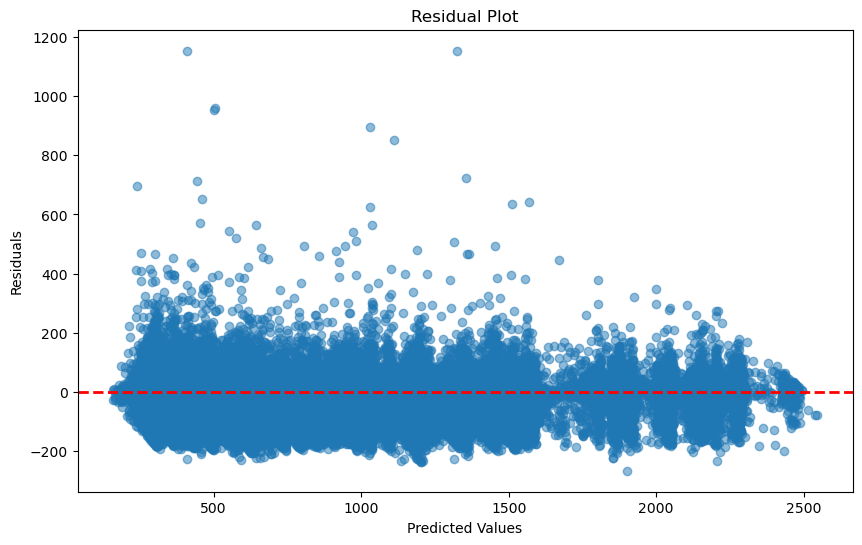

In [5]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 846us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 747us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 735us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 735us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 3s 717us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 3s 726us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 40.7959
Average RMSE across all folds: 58.1584
Average R-squared across all folds: 0.9870
-------------------------------------------------------
Test MAE: 40.1955
Test RMSE: 58.0038
Test R-squared: 0.9871


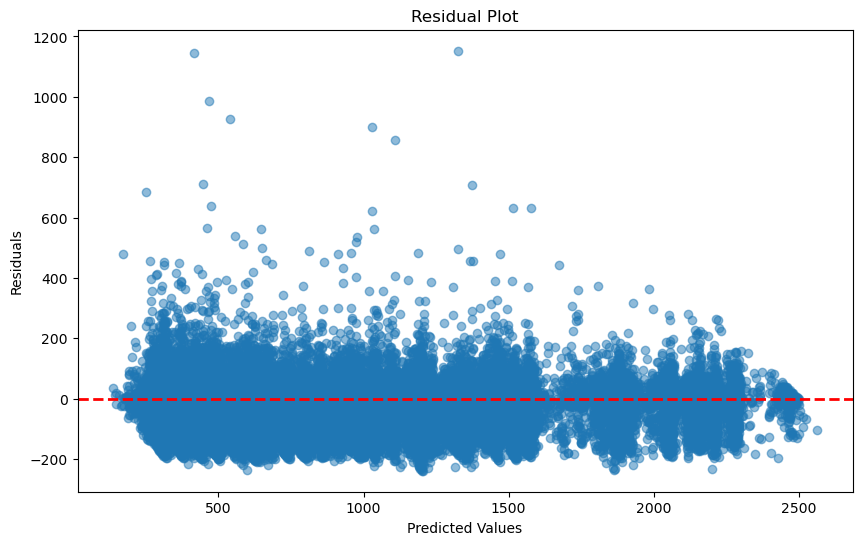

In [6]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 767us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 764us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 772us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 764us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 773us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 3s 773us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 47.2789
Average RMSE across all folds: 62.7477
Average R-squared across all folds: 0.9849
-------------------------------------------------------
Test MAE: 44.5148
Test RMSE: 60.3668
Test R-squared: 0.9860


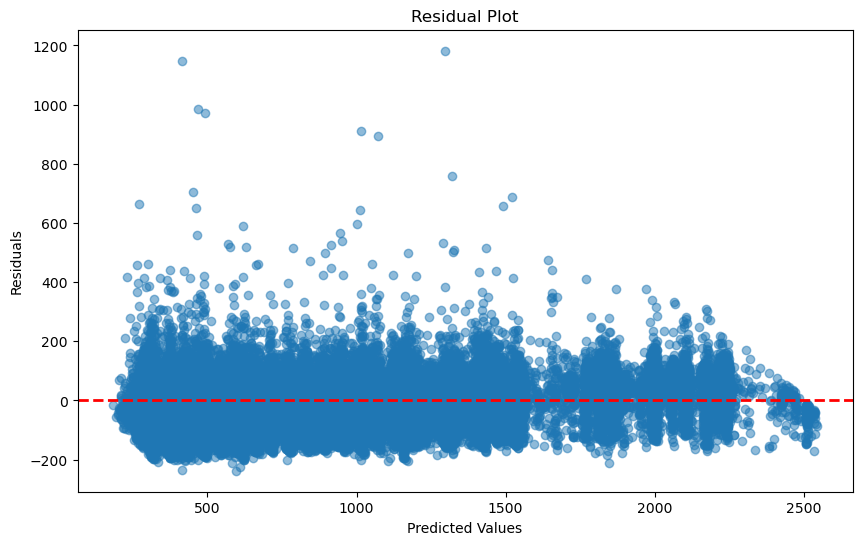

In [7]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="softplus"))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation="softplus"))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)
#Best MAE: 41.3118 using {"batch_size": 32, "epochs": 50, "model__activation": "softplus", "model__dropout_rate": 0.2, "model__neurons1": 256, "model__neurons2": 64, "model__optimizer": "nadam"}

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 743us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 751us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 748us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 782us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 746us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3551/3551 ━━━━━━━━━━━━━━━━━━━━ 3s 809us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Average MAE across all folds: 40.7220
Average RMSE across all folds: 57.7530
Average R-squared across all folds: 0.9872
-------------------------------------------------------
Test MAE: 40.4759
Test RMSE: 57.3052
Test R-squared: 0.9874


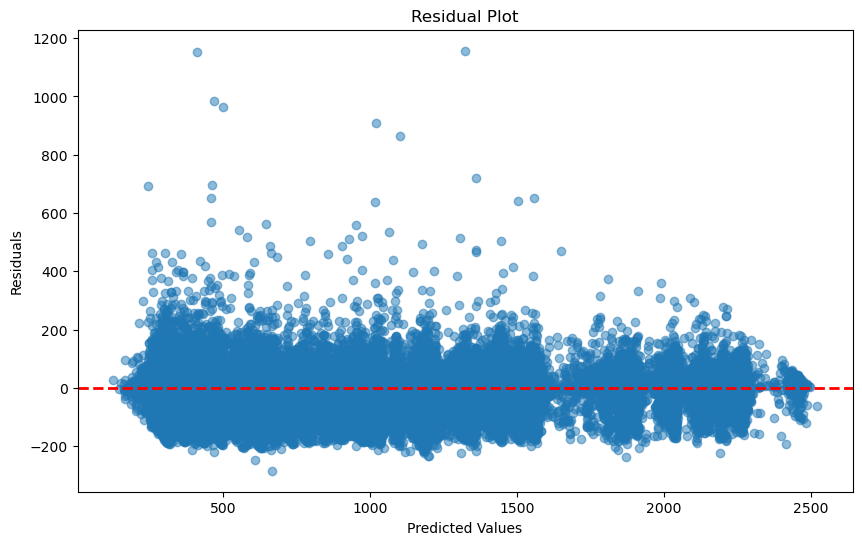

In [8]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(64, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# DF1 Optimized Model

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# DF2 Optimized Models

In [10]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 4s 833us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4734/4734 ━━━━━━━━━━━━━━━━━━━━ 5s 986us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


KeyboardInterrupt: 

# DF3 Optimized Model

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# DF4 Optimized Model

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# DF5 Optimized Model

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# DF6 Optimized Model

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dim, activation="relu"))
    model.add(Dense(128, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# Manual Grid Search

# Neurons

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 88.1006
Average RMSE across all folds: 107.5565
Average R-squared across all folds: 0.9554
-------------------------------------------------------
Test MAE: 98.5362
Test RMSE: 118.5393
Test R-squared: 0.9485


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


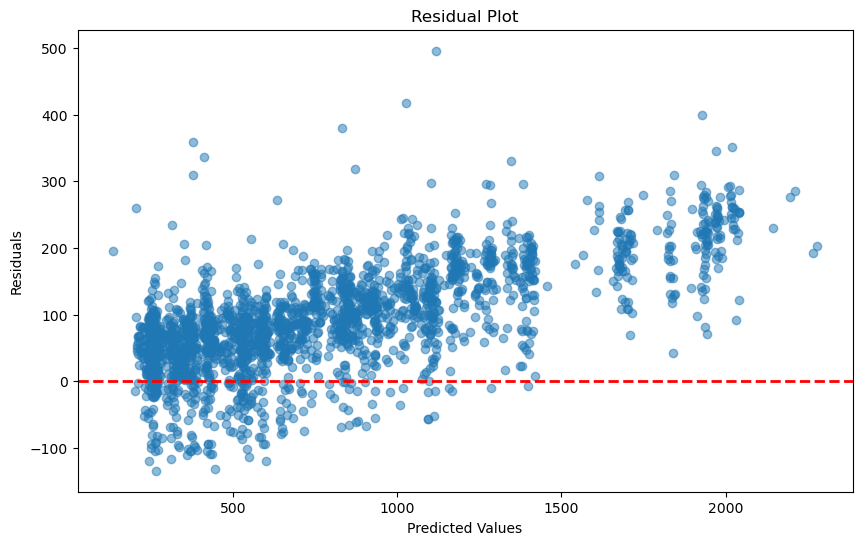

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(16, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Average MAE across all folds: 60.0840
Average RMSE across all folds: 74.9358
Average R-squared across all folds: 0.9781
-------------------------------------------------------
Test MAE: 53.3981
Test RMSE: 67.6007
Test R-squared: 0.9833


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


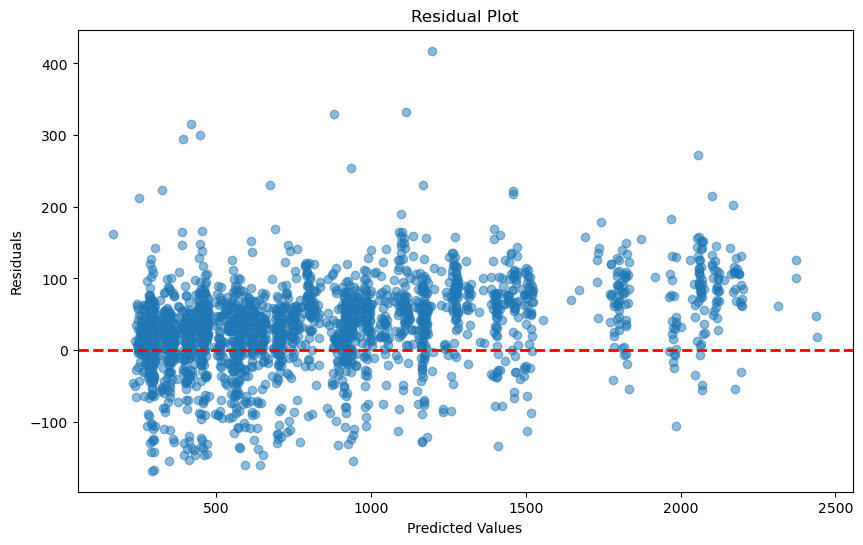

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 50.5005
Average RMSE across all folds: 64.1891
Average R-squared across all folds: 0.9841
-------------------------------------------------------
Test MAE: 57.2380
Test RMSE: 72.7953
Test R-squared: 0.9806


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


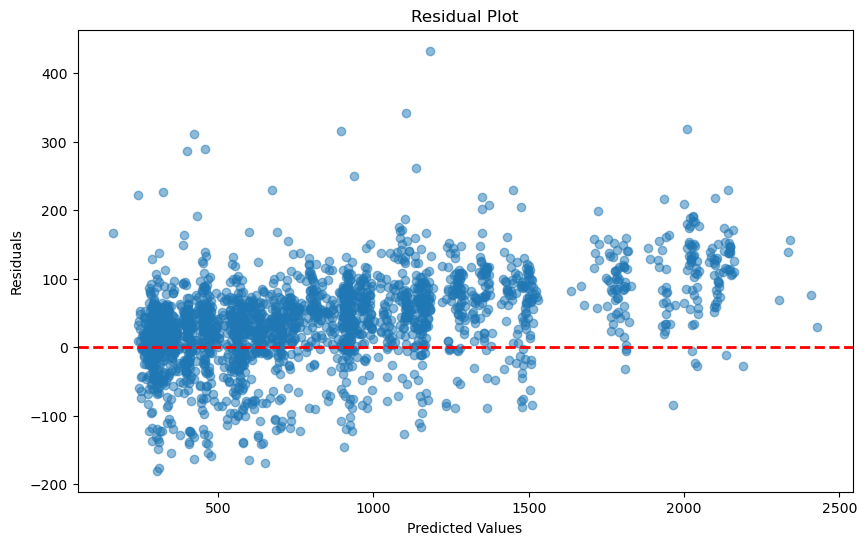

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 43.2987
Average RMSE across all folds: 57.8713
Average R-squared across all folds: 0.9872
-------------------------------------------------------
Test MAE: 44.5983
Test RMSE: 58.0862
Test R-squared: 0.9876


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


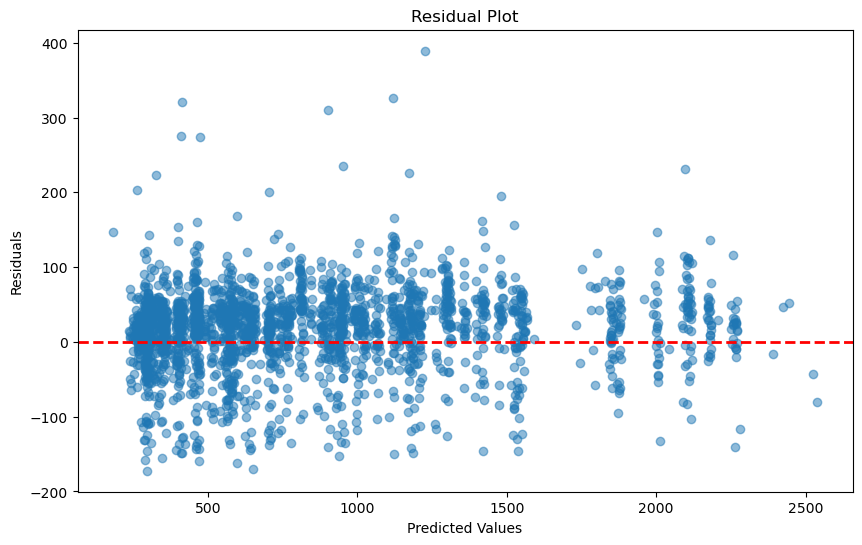

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(512, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(256, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# Dropout

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 65.7646
Average RMSE across all folds: 81.0785
Average R-squared across all folds: 0.9746
-------------------------------------------------------
Test MAE: 60.1967
Test RMSE: 74.6396
Test R-squared: 0.9796


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


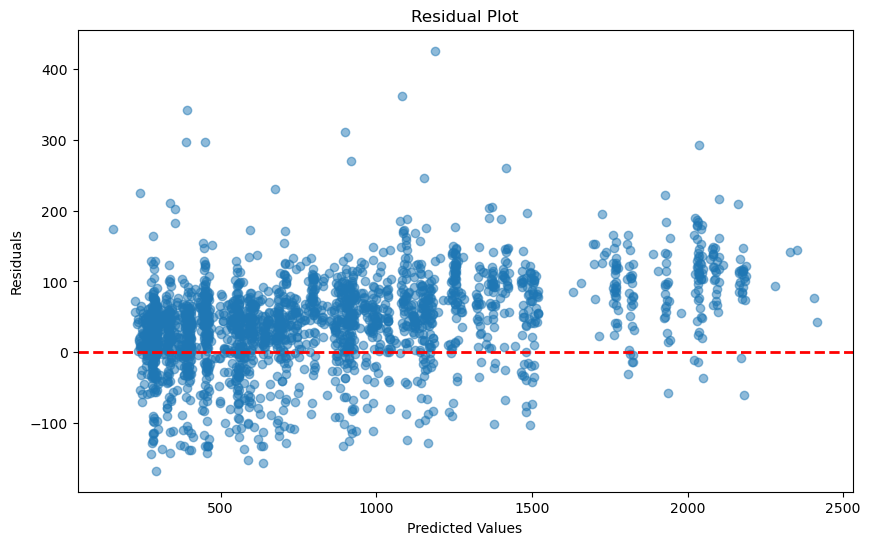

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 51.1814
Average RMSE across all folds: 65.2376
Average R-squared across all folds: 0.9837
-------------------------------------------------------
Test MAE: 54.7497
Test RMSE: 69.1008
Test R-squared: 0.9825


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


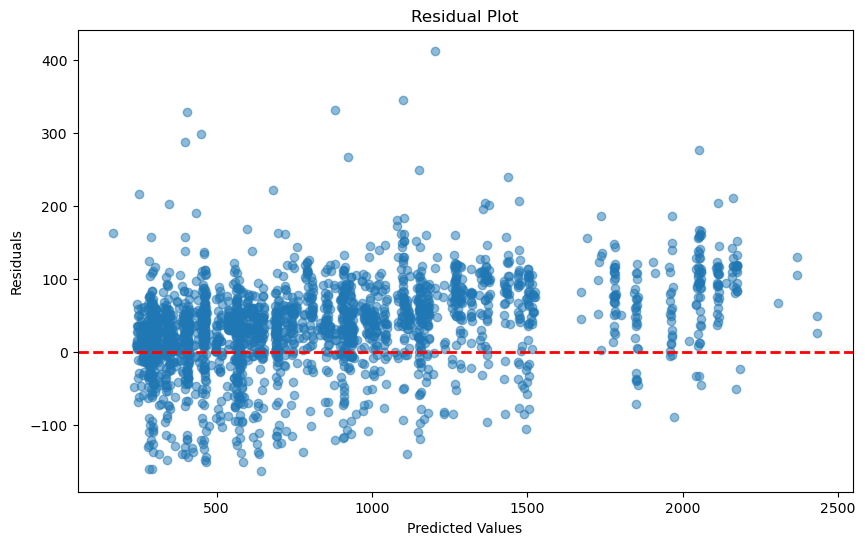

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.4))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.4))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 50.3822
Average RMSE across all folds: 64.4813
Average R-squared across all folds: 0.9841
-------------------------------------------------------
Test MAE: 42.6003
Test RMSE: 57.1074
Test R-squared: 0.9881


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


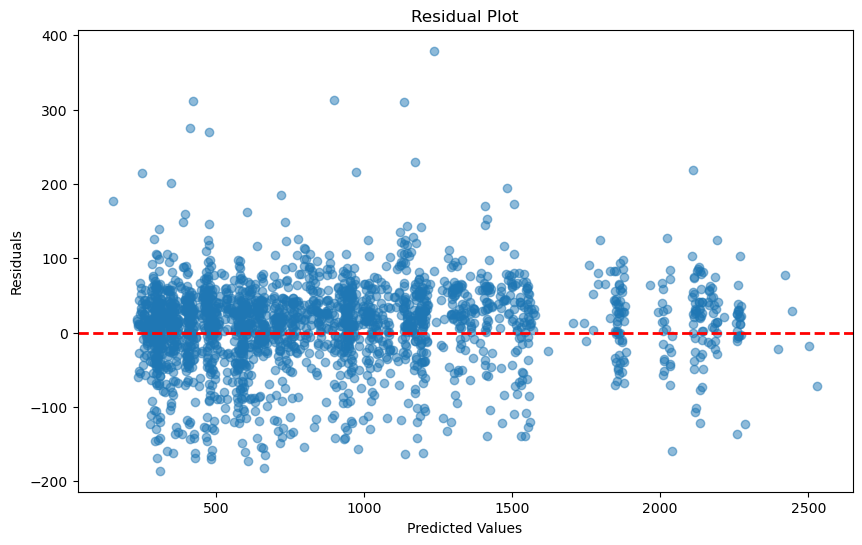

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.3))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.3))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 46.0066
Average RMSE across all folds: 60.3429
Average R-squared across all folds: 0.9860
-------------------------------------------------------
Test MAE: 41.3862
Test RMSE: 56.2023
Test R-squared: 0.9884


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


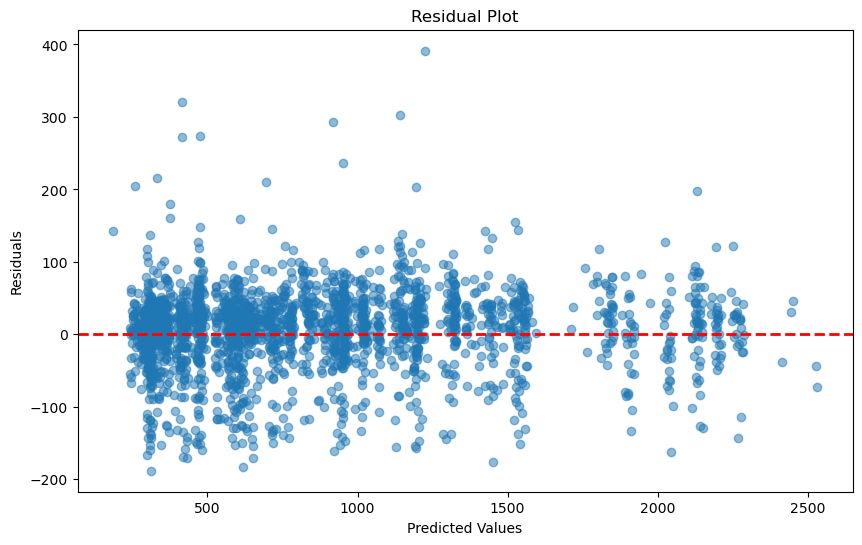

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 41.9369
Average RMSE across all folds: 56.9430
Average R-squared across all folds: 0.9876
-------------------------------------------------------
Test MAE: 39.7638
Test RMSE: 55.4207
Test R-squared: 0.9887


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


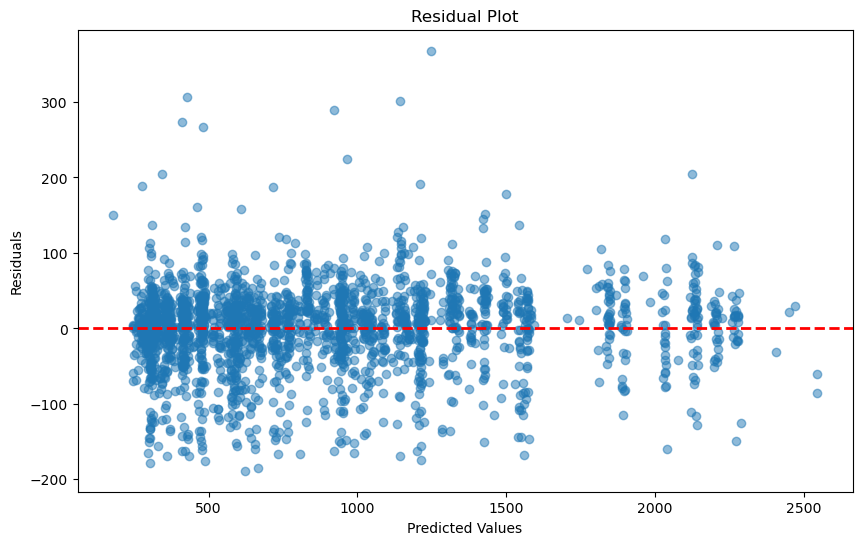

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.1))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 42.6355
Average RMSE across all folds: 57.2589
Average R-squared across all folds: 0.9874
-------------------------------------------------------
Test MAE: 45.0605
Test RMSE: 59.6165
Test R-squared: 0.9870


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


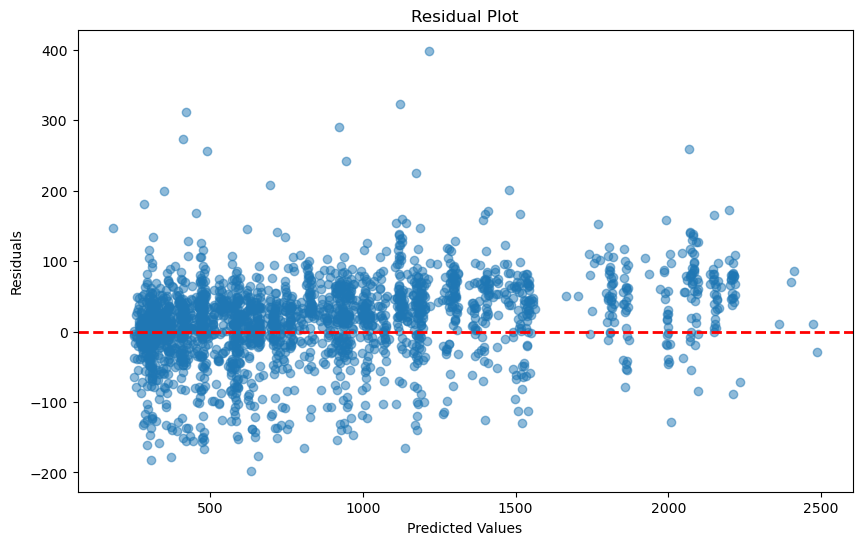

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 39.3470
Average RMSE across all folds: 55.7409
Average R-squared across all folds: 0.9881
-------------------------------------------------------
Test MAE: 38.0739
Test RMSE: 54.7219
Test R-squared: 0.9890


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


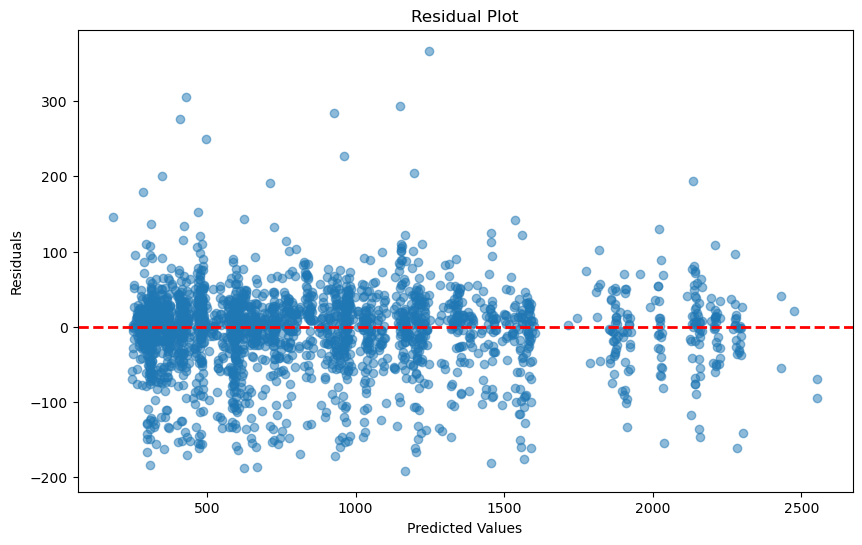

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dense(32, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# Activation Function

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 61.8209
Average RMSE across all folds: 77.3135
Average R-squared across all folds: 0.9769
-------------------------------------------------------
Test MAE: 61.2761
Test RMSE: 77.4690
Test R-squared: 0.9780


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


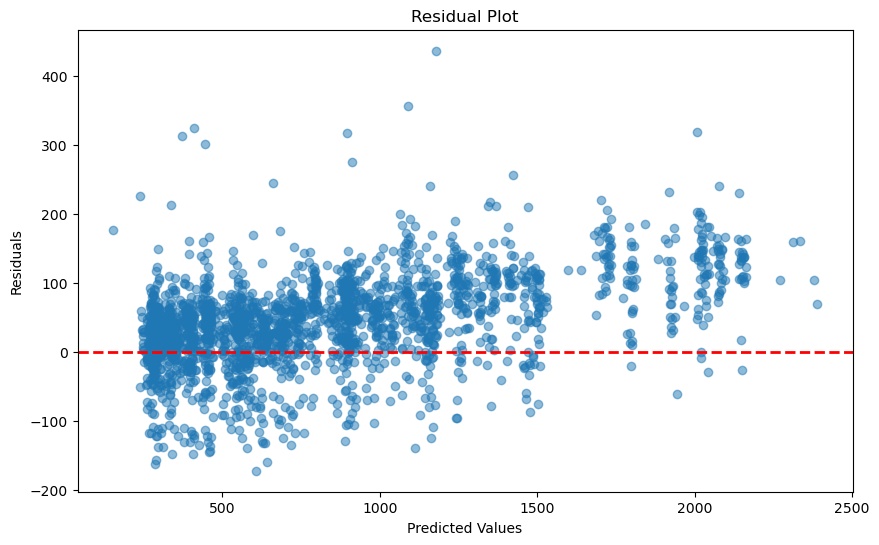

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 66.5413
Average RMSE across all folds: 89.3059
Average R-squared across all folds: 0.9693
-------------------------------------------------------
Test MAE: 56.8522
Test RMSE: 77.4689
Test R-squared: 0.9780


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


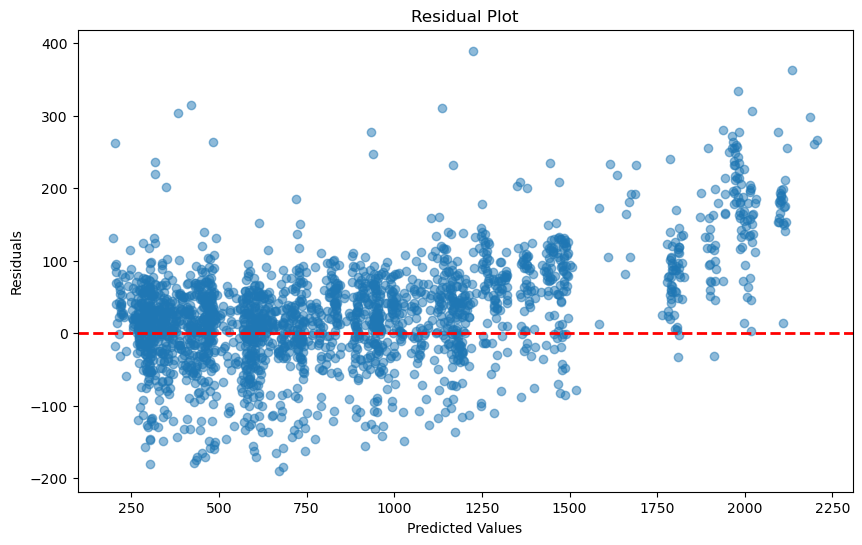

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="selu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="selu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 58.3482
Average RMSE across all folds: 73.6110
Average R-squared across all folds: 0.9792
-------------------------------------------------------
Test MAE: 54.8298
Test RMSE: 69.6983
Test R-squared: 0.9822


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


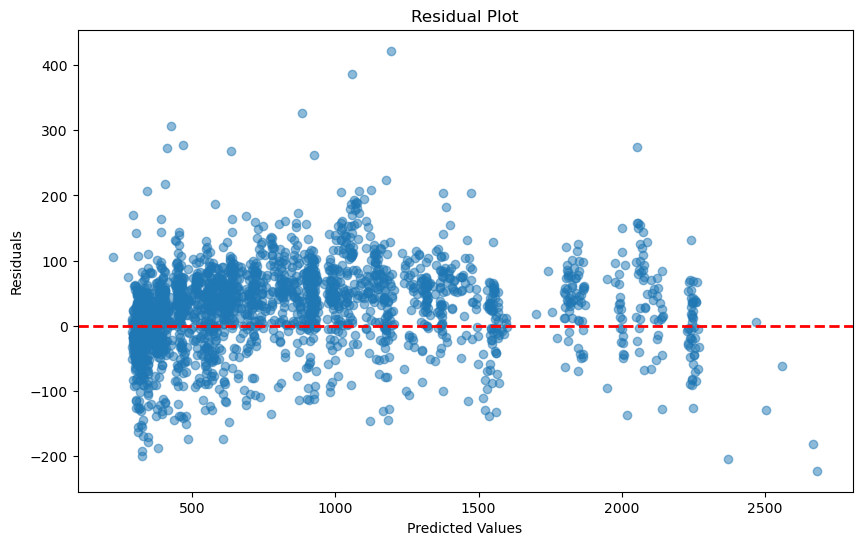

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="softplus"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="softplus"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 379.9166
Average RMSE across all folds: 577.9066
Average R-squared across all folds: -0.2796
-------------------------------------------------------
Test MAE: 314.0964
Test RMSE: 516.2823
Test R-squared: 0.0234


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


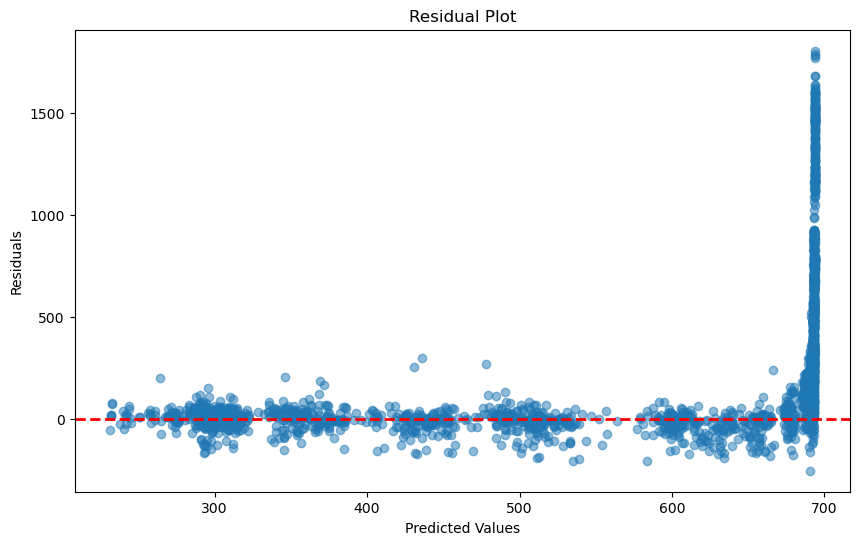

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="tanh"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="tanh"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# Optimizer

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 62.8364
Average RMSE across all folds: 78.7405
Average R-squared across all folds: 0.9760
-------------------------------------------------------
Test MAE: 62.9455
Test RMSE: 78.3087
Test R-squared: 0.9775


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


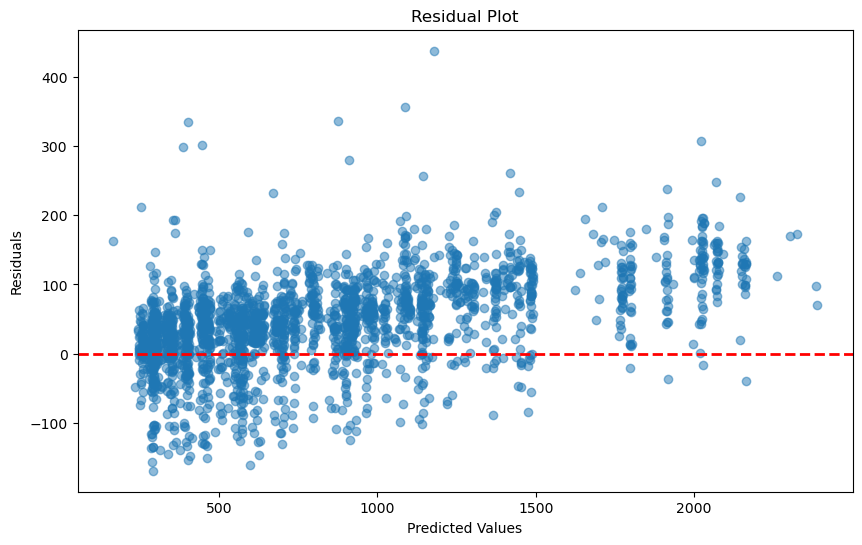

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 65.0544
Average RMSE across all folds: 81.2079
Average R-squared across all folds: 0.9744
-------------------------------------------------------
Test MAE: 52.9662
Test RMSE: 66.3022
Test R-squared: 0.9839


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


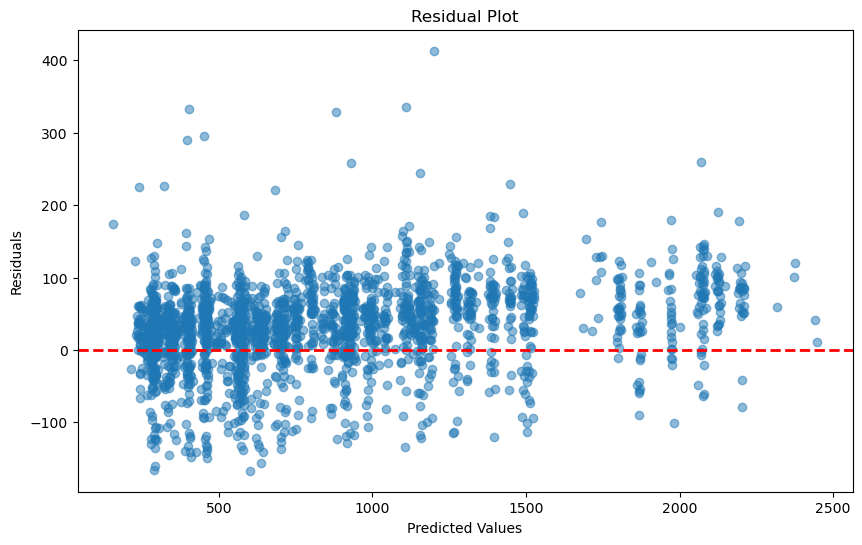

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 63.2671
Average RMSE across all folds: 79.1864
Average R-squared across all folds: 0.9758
-------------------------------------------------------
Test MAE: 63.0567
Test RMSE: 77.6662
Test R-squared: 0.9779


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


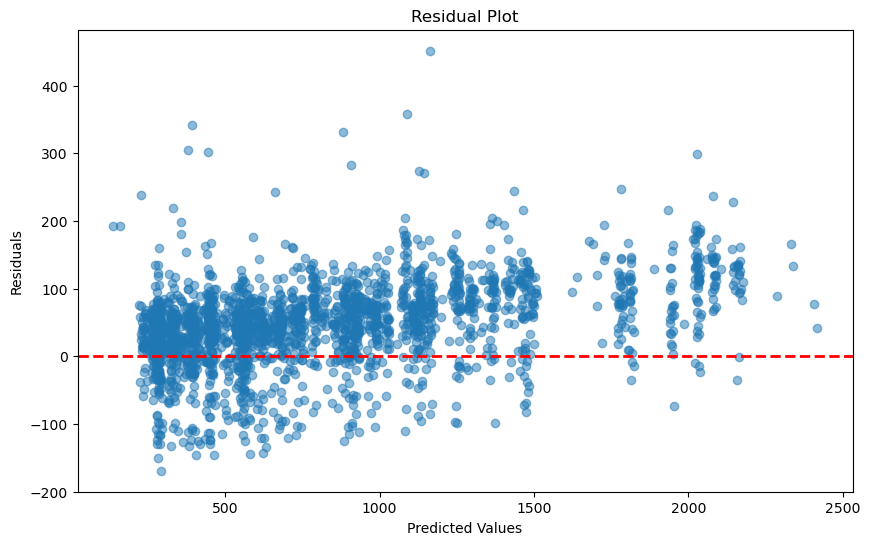

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="rmsprop", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 58.9357
Average RMSE across all folds: 73.6142
Average R-squared across all folds: 0.9792
-------------------------------------------------------
Test MAE: 56.4864
Test RMSE: 70.4274
Test R-squared: 0.9818


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


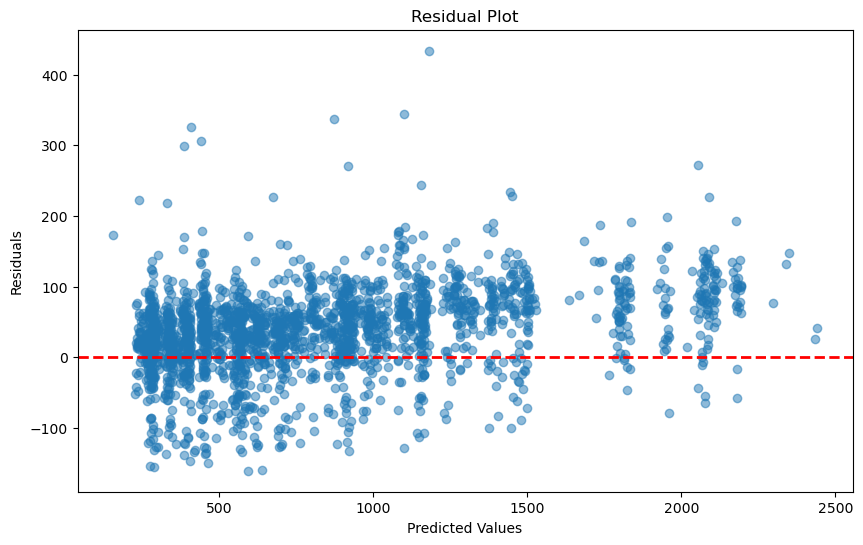

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="nadam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# Layers

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 50.2325
Average RMSE across all folds: 64.1440
Average R-squared across all folds: 0.9842
-------------------------------------------------------
Test MAE: 51.3613
Test RMSE: 65.1802
Test R-squared: 0.9844


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


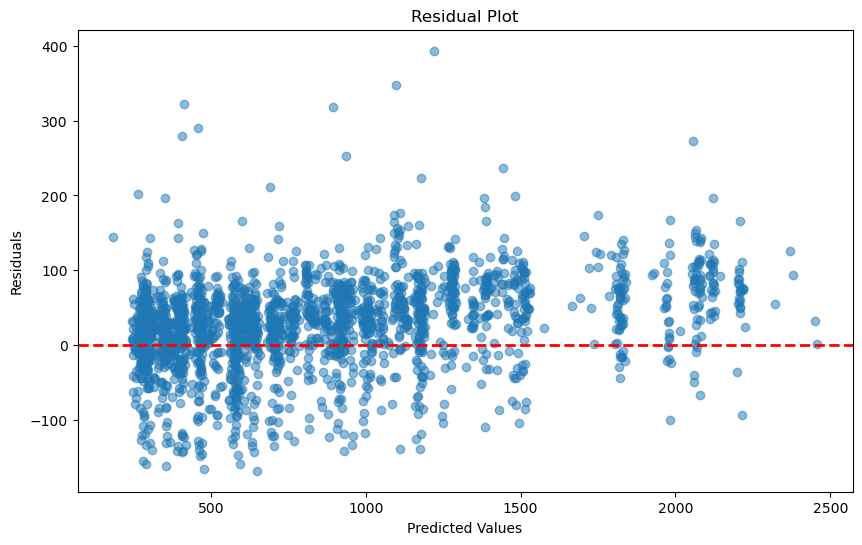

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 48.4595
Average RMSE across all folds: 62.8358
Average R-squared across all folds: 0.9849
-------------------------------------------------------
Test MAE: 47.0579
Test RMSE: 62.0919
Test R-squared: 0.9859


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


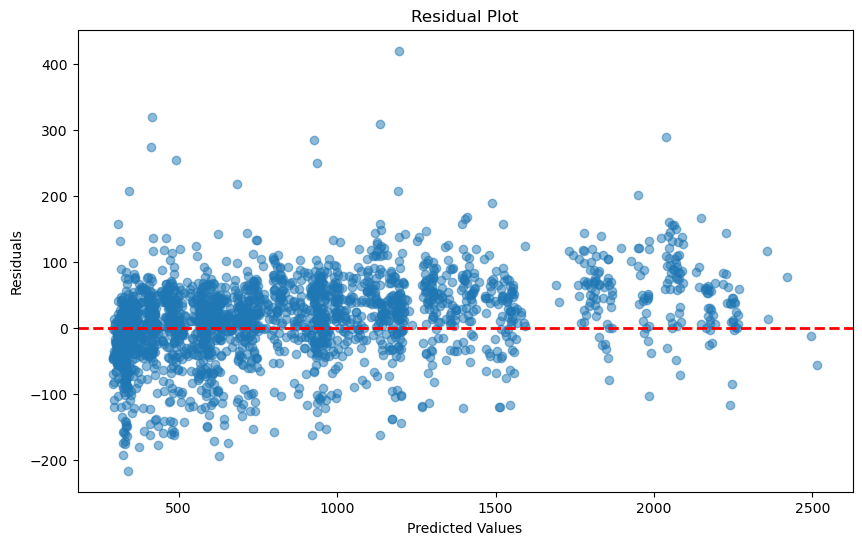

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 55.9069
Average RMSE across all folds: 71.2811
Average R-squared across all folds: 0.9796
-------------------------------------------------------
Test MAE: 73.1950
Test RMSE: 90.7958
Test R-squared: 0.9698


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


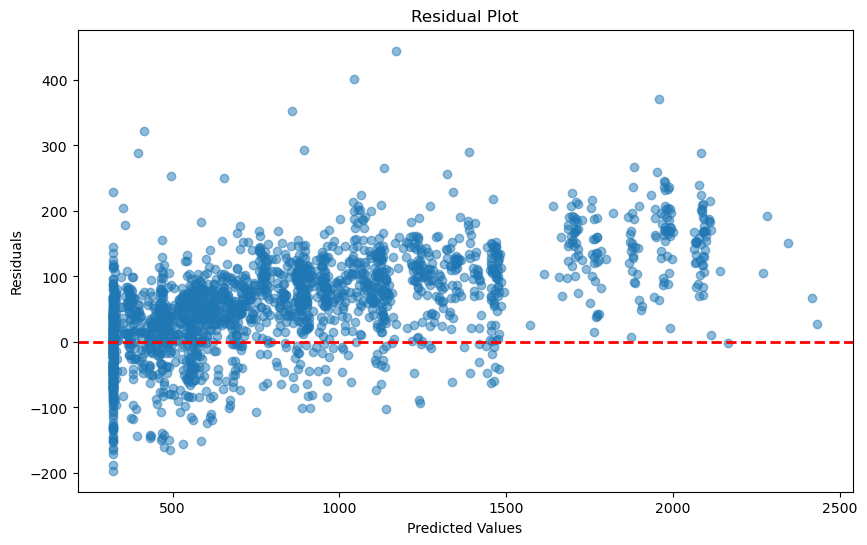

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 63.0635
Average RMSE across all folds: 80.7199
Average R-squared across all folds: 0.9738
-------------------------------------------------------
Test MAE: 89.6150
Test RMSE: 107.3352
Test R-squared: 0.9578


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


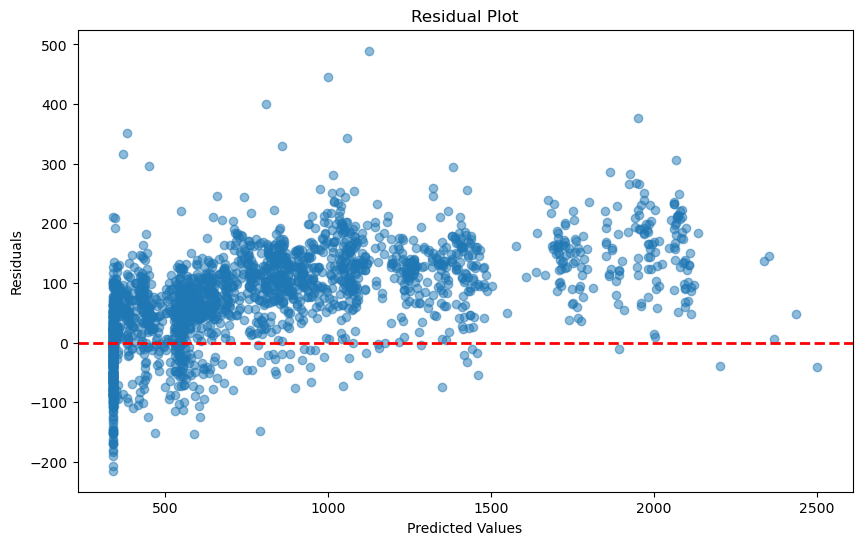

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# Epochs

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = False, epochs = 100, batch_size = 32, folds = 3, verbose = 1)

# Batch Normalization

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Average MAE across all folds: 61.6067
Average RMSE across all folds: 76.5223
Average R-squared across all folds: 0.9775
-------------------------------------------------------
Test MAE: 66.1571
Test RMSE: 82.1927
Test R-squared: 0.9752


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


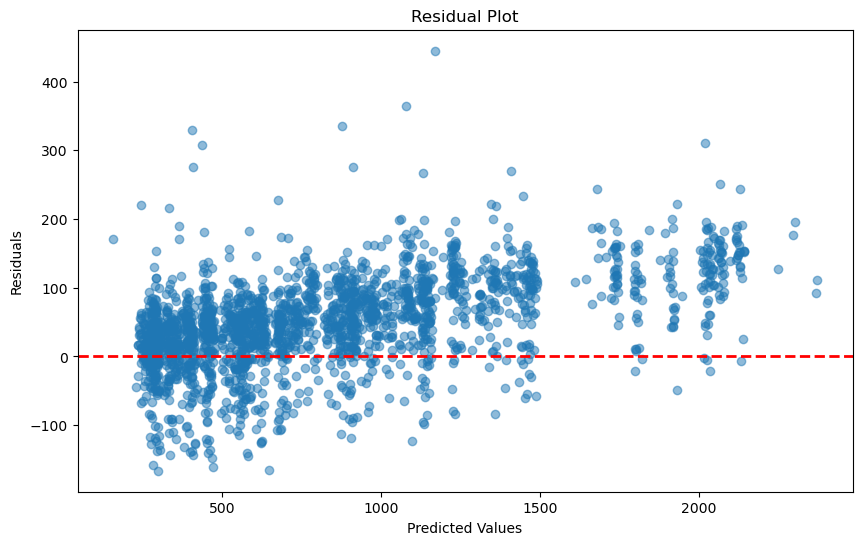

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\Tom\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 55.3505
Average RMSE across all folds: 72.4847
Average R-squared across all folds: 0.9798
-------------------------------------------------------
Test MAE: 54.6725
Test RMSE: 76.3908
Test R-squared: 0.9786


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


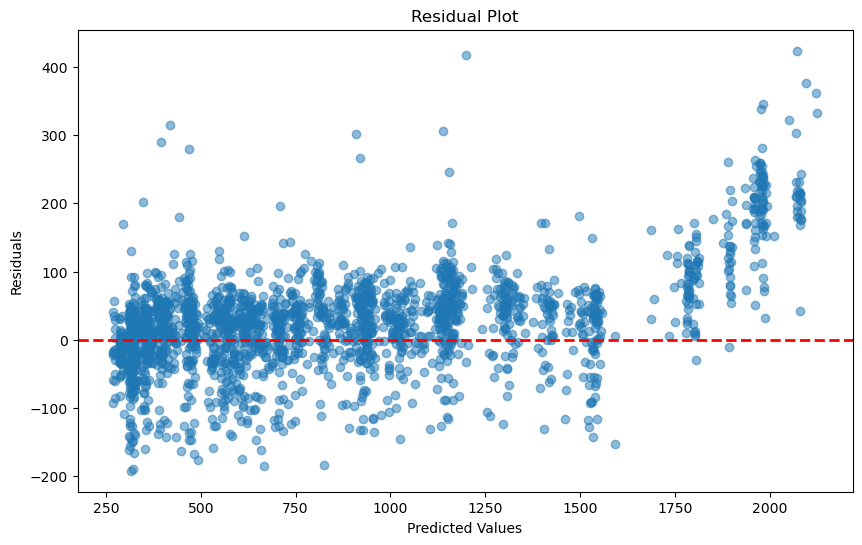

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(64, input_dim=input_dim, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adam", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True)

# Naive Best Model

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Average MAE across all folds: 42.6515
Average RMSE across all folds: 57.7275
Average R-squared across all folds: 0.9872
-------------------------------------------------------
Test MAE: 40.0391
Test RMSE: 55.4746
Test R-squared: 0.9887


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


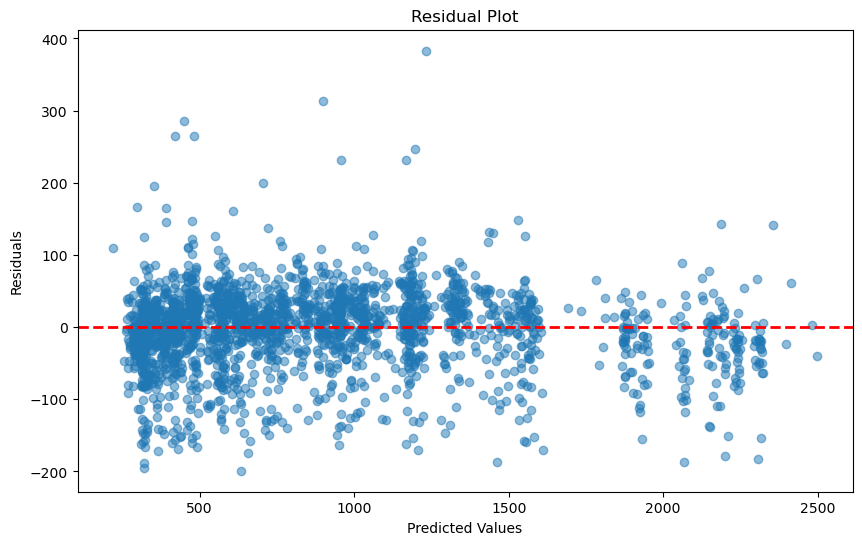

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dropout(0.1))
    model.add(Dense(128, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dropout(0.1))
    model.add(Dense(64, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Average MAE across all folds: 42.7951
Average RMSE across all folds: 57.5734
Average R-squared across all folds: 0.9873
-------------------------------------------------------
Test MAE: 39.8470
Test RMSE: 54.5227
Test R-squared: 0.9891


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


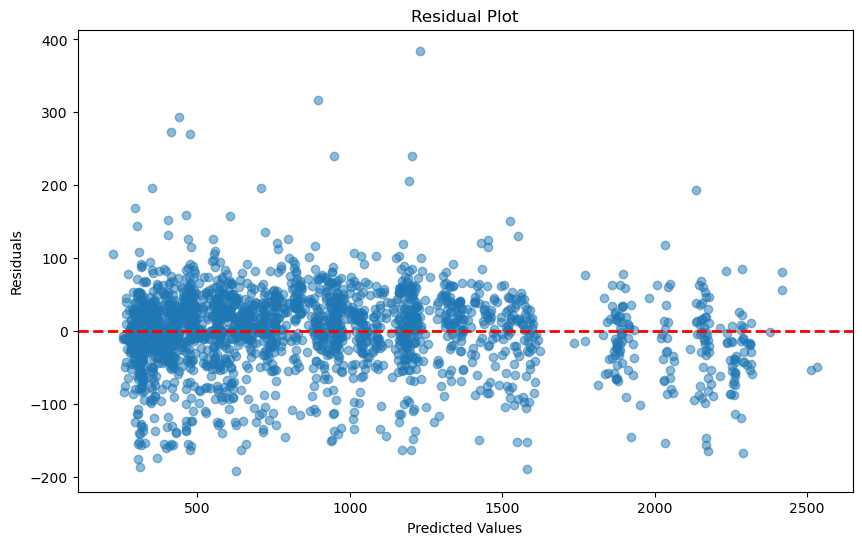

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(128, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(64, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 42.9357
Average RMSE across all folds: 58.0688
Average R-squared across all folds: 0.9870
-------------------------------------------------------
Test MAE: 40.6418
Test RMSE: 56.0433
Test R-squared: 0.9885


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


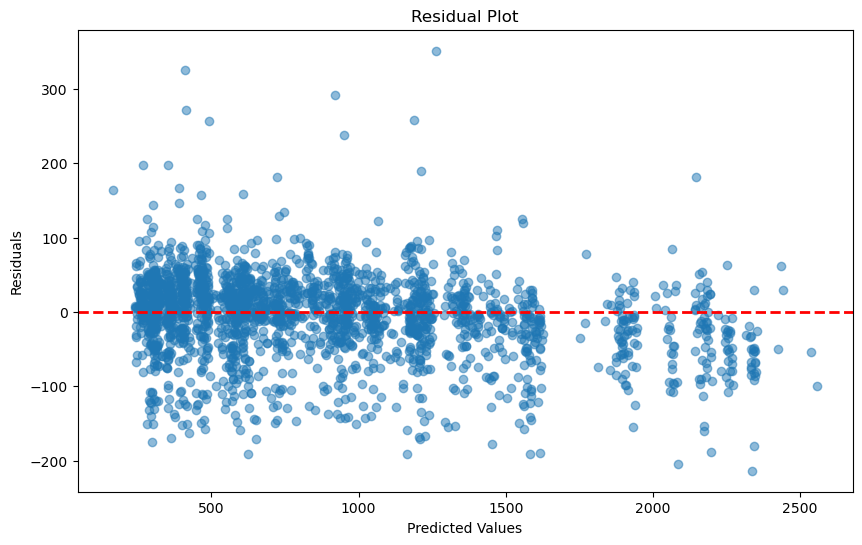

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dropout(0.1))
    model.add(Dense(128, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 43.1179
Average RMSE across all folds: 58.5950
Average R-squared across all folds: 0.9868
-------------------------------------------------------
Test MAE: 42.2575
Test RMSE: 57.6747
Test R-squared: 0.9878


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


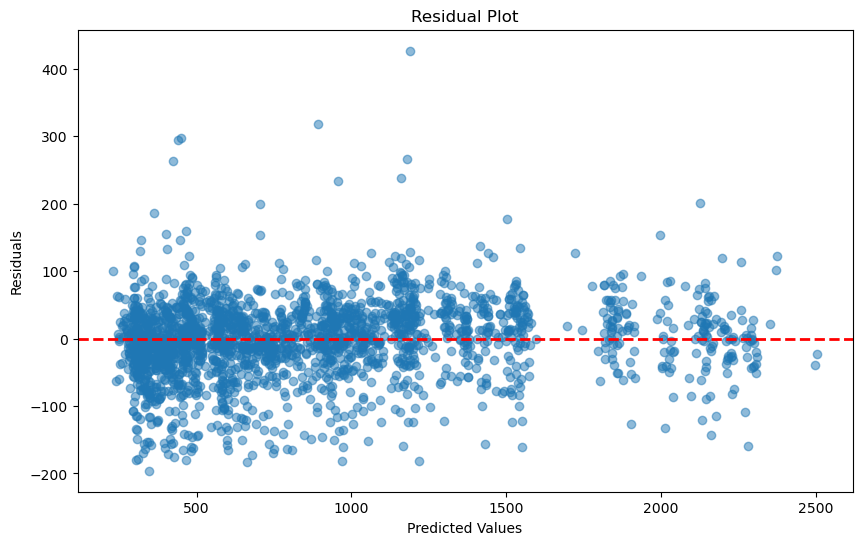

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(128, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 39.1933
Average RMSE across all folds: 55.3001
Average R-squared across all folds: 0.9883
-------------------------------------------------------
Test MAE: 39.0346
Test RMSE: 55.9966
Test R-squared: 0.9885


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


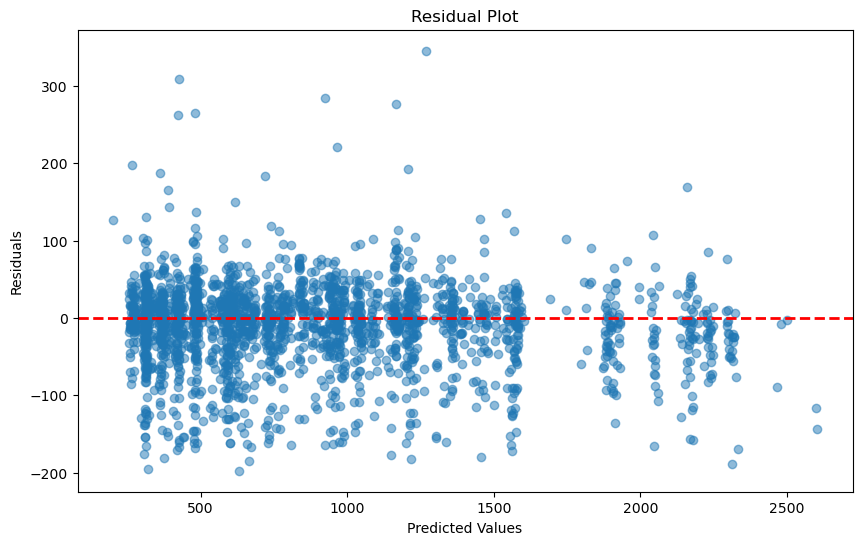

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="softplus"))
    model.add(Dense(128, activation="softplus"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 46.3224
Average RMSE across all folds: 62.3322
Average R-squared across all folds: 0.9851
-------------------------------------------------------
Test MAE: 44.0828
Test RMSE: 59.0306
Test R-squared: 0.9872


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


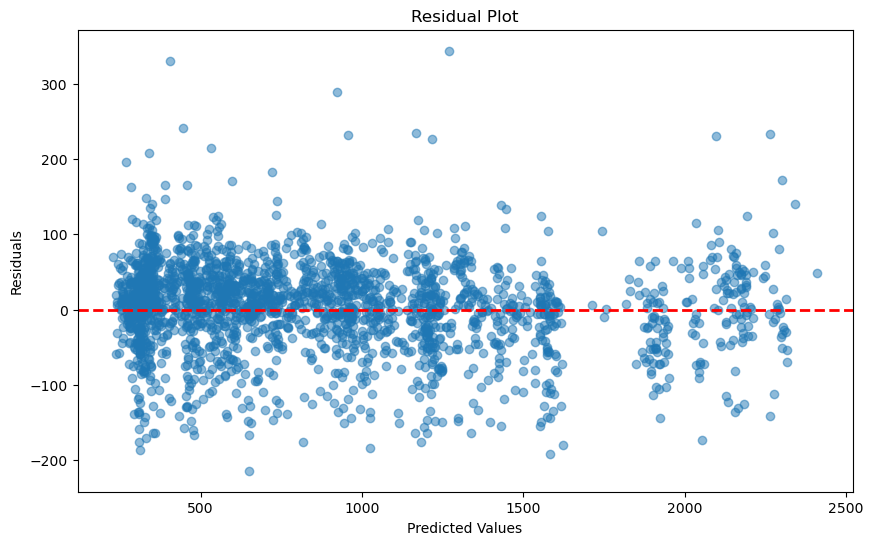

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(128, activation="softplus"))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Average MAE across all folds: 43.9168
Average RMSE across all folds: 60.1253
Average R-squared across all folds: 0.9861
-------------------------------------------------------
Test MAE: 45.2293
Test RMSE: 62.3834
Test R-squared: 0.9857


c:\Users\Tom\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


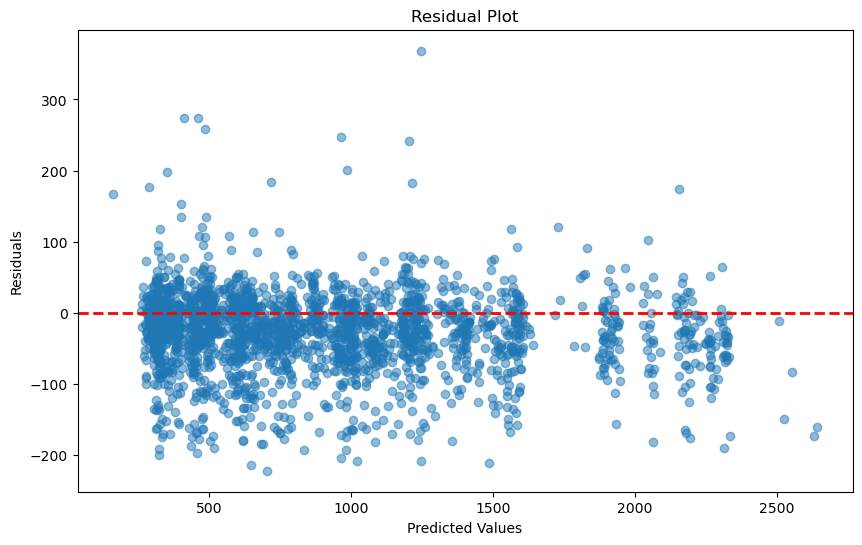

In [ ]:
def create_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Dense(256, activation="softplus"))
    model.add(Dense(128, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model)

# Grid Search 2.0

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from scikeras.wrappers import KerasRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.stats.api as sms
from sklearn.metrics import r2_score, mean_squared_error

def plot_residuals(y_true, y_pred):
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(0, color="r", linestyle="--", lw=2)
    plt.title("Residual Plot")
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")
    plt.show()

def create_model(dropout_rate=0.5, optimizer="adam", neurons1=64, neurons2=32, neurons3=32, activation="relu", batch_norm=False, third_layer=False):
    model = Sequential()
    model.add(Dense(neurons1, input_dim=X_train.shape[1], activation=activation))
    if batch_norm:
        model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(neurons2, activation=activation))
    if batch_norm:
        model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    if third_layer:
        model.add(Dense(neurons3, activation=activation))
        if batch_norm:
            model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer=optimizer, metrics=["mean_absolute_error"])
    return model

param_grid = {
    "model__neurons1": [64, 128, 256],
    "model__neurons2": [64, 128, 256],
    "model__neurons3": [64, 128, 256],
    "model__dropout_rate": [0, 0.1, 0.2],
    "model__activation": ["relu", "selu", "softplus"],
    "model__optimizer": ["adam", "adamax", "nadam"],
    "model__batch_norm": [True, False],
    "model__third_layer": [True, False],
    "batch_size": [32],
    "epochs": [50]
}

model = KerasRegressor(model=create_model, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, scoring="neg_mean_absolute_error", cv=3)
grid_result = grid.fit(X_train, y_train)

print(f"Best MAE: {-grid_result.best_score_:.4f} using {grid_result.best_params_}")

best_model = grid_result.best_estimator_.model_
history = best_model.fit(X_train, y_train, epochs=grid_result.best_params_["epochs"], batch_size=grid_result.best_params_["batch_size"], verbose=1)
loss, test_mae = best_model.evaluate(X_test, y_test, verbose=0)
predictions = best_model.predict(X_test).flatten()
test_r2 = r2_score(y_test, predictions)
rmse = mean_squared_error(y_test, predictions, squared=False)

print(f"Test MAE: {test_mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"Test R-squared: {test_r2:.4f}")


plot_residuals(y_test, predictions)

#Best MAE: 41.3118 using {"batch_size": 32, "epochs": 50, "model__activation": "softplus", "model__dropout_rate": 0.2, "model__neurons1": 256, "model__neurons2": 64, "model__optimizer": "nadam"}
#Test MAE: 44.2050
#RMSE: 60.3173
#Test R-squared: 0.9867

c:\Users\Tom\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


KeyboardInterrupt: 

# Naive Model

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Dense(512, input_dim=input_dim, activation="softplus"))
    model.add(BatchNormalization())
    model.add(Dense(1))
    model.compile(loss="mean_absolute_error", optimizer="adamax", metrics=["mean_absolute_error"])
    return model

run_model(create_model, bnormal = True, epochs = 50, batch_size = 64, folds = 3, verbose = 0)